# An analysis of the COVID-19's effect on the pollution level in India

A nationwide lockdown imposed areoss India on 24 March to stop the spread of coronavirus. Especially among the country 300 million poor. Yet in Delhi, the world's most polluted city, it has also resulted in some of the freshest air the captial has seen in deades.

# Objective

Here we have access to a large amount of granular data to relating to the concentration of major air polluntants in india and it will be interseting to see if the claim of reduced air pollution is being actually backed by data

**Primary Pollutants:** A primary pollutant is an air pollutant emitted directly from a source. 
Example: Carbon Monoxide, Carbon Dioxide, Sulphur Dioxide , Most hydrocarbons and Most suspended particles.

**Secondary Pollutant:** A secondary pollutant is not directly emitted as such, but forms when other pollutanrs react in the atmosphere.

# Import Libraries


In [ ]:
# import the necessary libraries
import numpy as np 
import pandas as pd 
import os

# Visualisation libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
import pycountry
from plotly.subplots import make_subplots

import plotly.express as px
from plotly.offline import init_notebook_mode, iplot 
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
import chart_studio.plotly as py
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff

import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
#py.init_notebook_mode(connected=True)
# color pallette
cnf, dth, rec, act,wth,sth = '#393e46', '#ff2e63', '#21bf73', '#fe9801','#456fe3','#78ffee' 
#Geographical Plotting
import folium
from folium import Choropleth, Circle, Marker
from folium import plugins
from folium.plugins import HeatMap, MarkerCluster
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters() 

from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)
#Racing Bar Chart
import bar_chart_race as bcr
from IPython.display import display_html
# Increase the default plot size and set the color scheme
plt.rcParams['figure.figsize'] = 8, 5
plt.style.use("fivethirtyeight")# for pretty graphs


# Disable warnings 
import warnings
warnings.filterwarnings('ignore')


[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
station_hour=pd.read_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/station_hour.csv')
station_day=pd.read_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/station_day.csv')
stations=pd.read_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/stations.csv')
city_day=pd.read_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/city_day.csv')
city_hour=pd.read_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/city_hour.csv')
city=pd.read_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/cities.csv')

## Analysis at City level- daily data
 
We have daily and hourly city data as well as daily and hourly Satation data. Station refers to the continuous pollution monitoring stations operated and maintained by the Central Pollution Control Board(CPCB) and the State Pollution Control Boards.Let's begin by analyzing the various cities dialy data to get a big picture. We shall begin by importing the dataset and the necessary libraries for the analysis

In [4]:
display("City In India")
display(city.head())
display(city.shape)

'City In India'

,City,Lat,Long,country,iso2,State
0,Abohar,30.144533,74.195520,India,IN,Punjab
1,Adilabad,19.400000,78.310000,India,IN,Telangana
2,Agartala,23.836049,91.279386,India,IN,Tripura
3,Agra,27.187935,78.003944,India,IN,Uttar Pradesh
4,Ahmadnagar,19.094571,74.738432,India,IN,Maharashtra


(213, 6)

In [5]:
display("City Day in india")
display(city_day.head())
display(city_day.shape)

'City Day in india'

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN


(29531, 16)

# Features Description 

**1.PM2.5**: It refers to particles that have diameter less than 2.5 micrometers(more than 100 times thinner than human air) and remain suspended for longer. These particles are formed as a result of burning fuel and chemical reactions that take place in the atmosphere.


**2.PM10**: PM10 are the particles with a diameter of 10 micrometers and they are also called fine particles. An environmental expert says that PM10 is also known as respirable particulate mattter.Particulate matter is a complex mixture of soot,smoke,metals,nitrates,sulphates,dust water and rubber etc



**3.NO**: Nitric oxide is not considered to be hazardous to health at typical ambient concentrations, but nitrogen dioxide can be. ... NOx gases react to form smong and acid rain as well as being central to the formation of fine particles(PM) and ground level ozone.



**4.NO2**: Nitrogen dioxide is part of a group of gaseous air pollutants produced as a result of road traffic and other fossil fuel combustion processes. Its presence in air pollutants.



**5.NH3**: Gaseous ammonia (NH3) is the most abundant alkaline gas in the atmosphere. NH3 plays a significant role int he formation of atmospheric particulate matter,visibility degradation and atmospheric deposition of nitrogen to sensitive ecosystem.



**6.CO**: It is produced in the incomplete combustion of carbon-containing fuels such as gasoline,natural gas,oil,coal and wood.



**7.SO2**: It is formed when fuel containing sulphur such as coal and oil, is burned,creating air pollution. It affect the environment when they react with substances in the atmosphere to form acid rain.



**8.O3**: It is harmful to air quality outside of the ozone layer.Ground level ozone is a colorless and highly irritating gas that forms just above the earth's surface.



**9.Benzene**:The benzene in indoor comes from product that contain benzene such as glues,paints , furniture wax , and detergents.The air around hazardous waste sites or gas stations can contain higher level of benzene than in other areas.



**10.Toluene**: Motor vehicle and industrial emmissions are the major sources of pollutants .



**11.Xylene**: Motor vechicle emissions are the predominant source of xylene in the urban air environment. Evaporation from petroleum fuel storage facilities and service stations.



**12.AQI**: The air quality index is an index for reporting air quality on a daily basis. It is a measure of how air pollution affects one's health with in short time period. The purpose of the AQI is to help kow how the local air quality impacts their health.



**13. AQI_Bucket:** it is variable of AQI.

In [6]:
display(city_day.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   City        29531 non-null  object 
 1   Date        29531 non-null  object 
 2   PM2.5       24933 non-null  float64
 3   PM10        18391 non-null  float64
 4   NO          25949 non-null  float64
 5   NO2         25946 non-null  float64
 6   NOx         25346 non-null  float64
 7   NH3         19203 non-null  float64
 8   CO          27472 non-null  float64
 9   SO2         25677 non-null  float64
 10  O3          25509 non-null  float64
 11  Benzene     23908 non-null  float64
 12  Toluene     21490 non-null  float64
 13  Xylene      11422 non-null  float64
 14  AQI         24850 non-null  float64
 15  AQI_Bucket  24850 non-null  object 
dtypes: float64(13), object(3)
memory usage: 3.6+ MB


None

In [7]:
#determined ht emissing data
def Missing (X):
    total = X.isnull().sum().sort_values(ascending = False)
    percent = round(X.isnull().sum().sort_values(ascending = False)/len(X)*100, 2)
    missing = pd.concat([total, percent], axis = 1,keys= ['Total', 'Percent'])
    return(missing) 
#plots number of dataframes side by side
def SideSide(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw = True)


CITY DAY DATA


,Total,Percent
Xylene,18109,61.32
PM10,11140,37.72
NH3,10328,34.97
Toluene,8041,27.23
Benzene,5623,19.04
AQI,4681,15.85
AQI_Bucket,4681,15.85
PM2.5,4598,15.57
NOx,4185,14.17
O3,4022,13.62




  MISSING  DATA 


<Axes: >

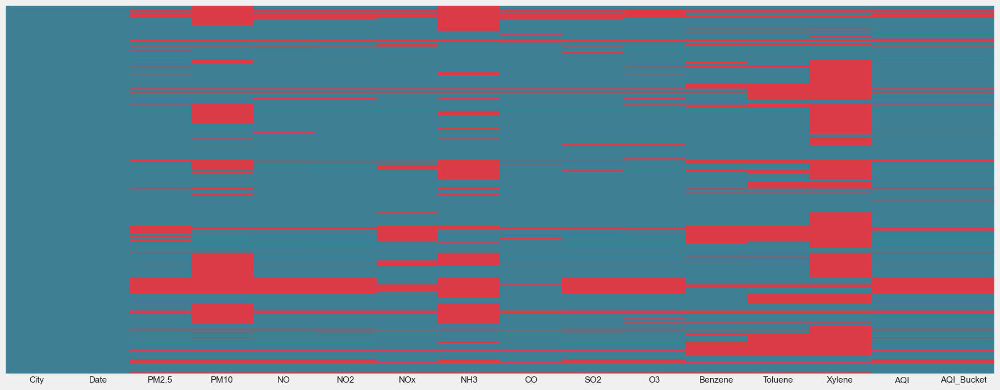

In [8]:
# Fill empty values with NaN
city_day = city_day.fillna(np.nan)
#finds missing values
missing_city_day = Missing(city_day)
print('CITY DAY DATA')
SideSide(missing_city_day)
print('\n\n  MISSING  DATA ')
cmap = sns.diverging_palette( 220 , 10 , as_cmap = True )
plt.figure(figsize = (20,8));
sns.heatmap(city_day.isnull(), yticklabels = False, cbar = False, cmap = cmap)

# Cities in the dataset


In [10]:
cities=city_day['City'].value_counts()
print('total number of cities in the dataset:',len(cities))
print(cities.index)


total number of cities in the dataset: 26
Index(['Ahmedabad', 'Delhi', 'Mumbai', 'Bengaluru', 'Lucknow', 'Chennai',
       'Hyderabad', 'Patna', 'Gurugram', 'Visakhapatnam', 'Amritsar',
       'Jorapokhar', 'Jaipur', 'Thiruvananthapuram', 'Amaravati',
       'Brajrajnagar', 'Talcher', 'Kolkata', 'Guwahati', 'Coimbatore',
       'Shillong', 'Chandigarh', 'Bhopal', 'Ernakulam', 'Kochi', 'Aizawl'],
      dtype='object', name='City')


# Convert to Date Time format

Let's convert the Date column into Date Time format with the help of datetime library

In [11]:
# Convert string to datetime 64
city_day['Date']=pd.to_datetime(city_day['Date'])


In [12]:
print(f"The available data is between {city_day['Date'].min()} and {city_day['Date'].max()}")

The available data is between 2015-01-01 00:00:00 and 2020-07-01 00:00:00


# Analysing the Complete City Level Daily Data

Let's now analyse the work with the data to see what patterns and insights 

In [13]:
# combining the PM2.5 and PM10 into one column 
city_day['Particulate_Matter']=city_day['PM2.5']+city_day['PM10']

In [14]:
# Combining the Benezene ,Toulene and Xylene levels into one column
city_day['poisionus']=city_day['Benzene']+city_day['Toluene']+city_day['Xylene']
city_day.drop(['Benzene','Toluene','Xylene'],axis=1)

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,AQI,AQI_Bucket,Particulate_Matter,poisionus
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,NaN,NaN,NaN,0.02
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,NaN,NaN,NaN,12.95
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,NaN,NaN,NaN,25.45
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,NaN,NaN,NaN,15.57
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,NaN,NaN,NaN,28.68
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29526,Visakhapatnam,2020-06-27,15.02,50.94,7.68,25.06,19.54,12.47,0.47,8.55,23.30,41.0,Good,65.96,15.04
29527,Visakhapatnam,2020-06-28,24.38,74.09,3.42,26.06,16.53,11.99,0.52,12.72,30.14,70.0,Satisfactory,98.47,3.33
29528,Visakhapatnam,2020-06-29,22.91,65.73,3.45,29.53,18.33,10.71,0.48,8.42,30.96,68.0,Satisfactory,88.64,0.02
29529,Visakhapatnam,2020-06-30,16.64,49.97,4.05,29.26,18.80,10.03,0.52,9.84,28.30,54.0,Satisfactory,66.61,0.00


In [15]:
city_day['AQI_Bucket'].value_counts()

AQI_Bucket
Moderate        8829
Satisfactory    8224
Poor            2781
Very Poor       2337
Good            1341
Severe          1338
Name: count, dtype: int64

<Axes: xlabel='count', ylabel='AQI_Bucket'>

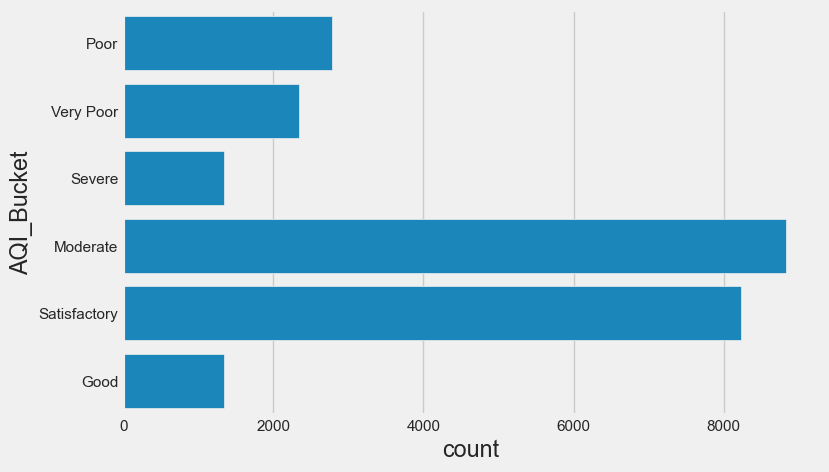

In [16]:
sns.countplot(city_day['AQI_Bucket'])

In [49]:
primary_pollutants=['PM2.5','PM10','NO2','NOx','CO','SO2']
secondary_pollutants=['poisionus','O3']

**Visualising yearly data**

In [20]:
temp=city_day.groupby('Date')[['PM2.5','PM10','NO2','NOx','CO','SO2']].sum().reset_index()
temp=temp.melt(id_vars="Date",value_vars=['PM2.5','PM10','NO2','NOx','CO','SO2'],var_name='Pollutants',value_name='Count')
temp.head()
fig=px.area(temp,x='Date',y='Count',color='Pollutants',height=600,title='Primary Pollutant over time',color_discrete_sequence=[cnf, dth, rec, act,wth,sth])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [30]:
temp=city_day.groupby('Date')[['poisionus','O3']].sum().reset_index()
temp=temp.melt(id_vars="Date",value_vars=['poisionus','O3'],var_name='Pollutants',value_name='Count')
temp.head()
fig=px.area(temp,x='Date',y='Count',color='Pollutants',height=600,title='Secondary Pollutant over time',color_discrete_sequence=[cnf, dth])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [32]:
def trend_plot(dataframe,value):
    
    # Prepare data
    df['year'] = [d.year for d in df.Date]
    df['month'] = [d.strftime('%b') for d in df.Date]
    years = df['year'].unique()

    # Draw Plot
    fig, axes = plt.subplots(1, 2, figsize=(14,6), dpi= 80)
    sns.boxplot(x='year', y=value, data=df, ax=axes[0])
    sns.pointplot(x='month', y=value, data=df.loc[~df.year.isin([2015, 2020]), :])

    # Set Title
    axes[0].set_title('Year-wise Box Plot \n(The Trend)', fontsize=18); 
    axes[1].set_title('Month-wise Plot \n(The Seasonality)', fontsize=18)
    plt.show()

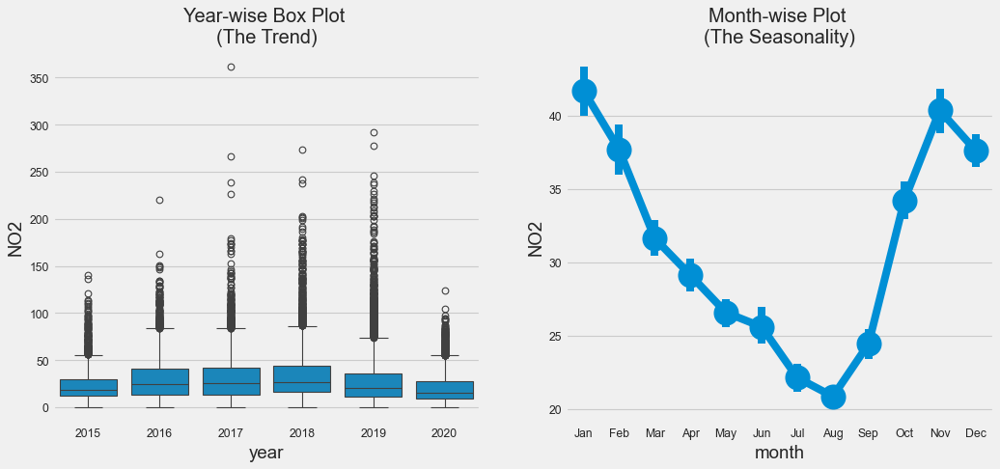

In [33]:
city_day.reset_index(inplace=True)
df = city_day.copy()
value='NO2'
trend_plot(df,value)

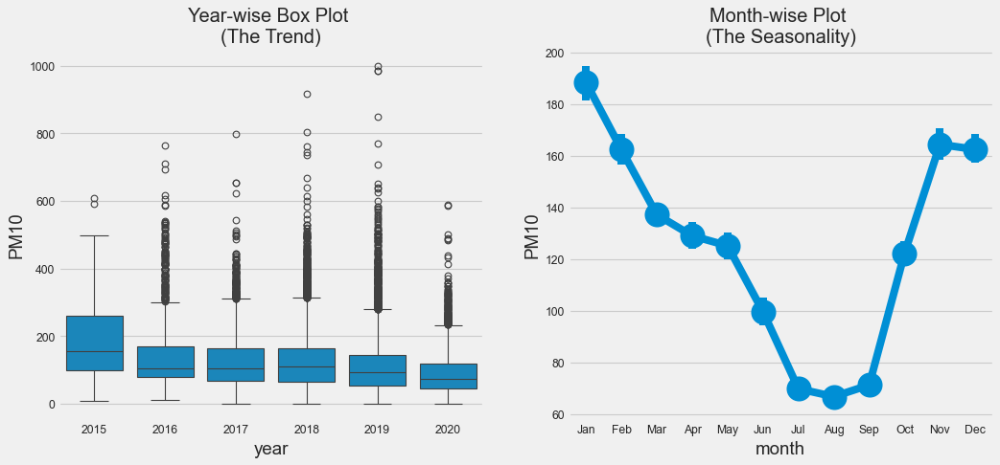

In [34]:
city_day.reset_index(inplace=True)
df = city_day.copy()
value='PM10'
trend_plot(df,value)

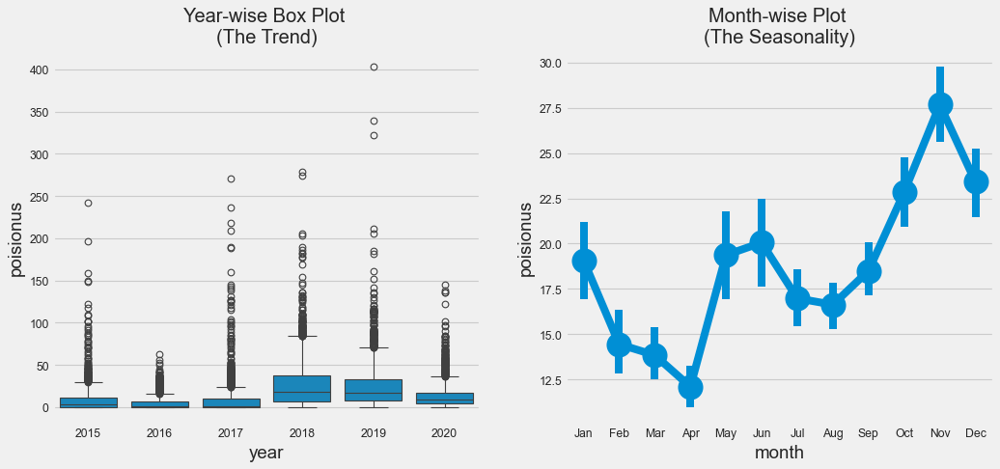

In [35]:
city_day.reset_index(inplace=True)
df = city_day.copy()
value='poisionus'
trend_plot(df,value)

In [36]:
def max_polluted_city(pollutant):
    x1 = city_day[[pollutant,'City']].groupby(["City"]).mean().sort_values(by=pollutant,ascending=False).reset_index()
    x1[pollutant] = round(x1[pollutant],2)
    return x1[:10].style.background_gradient(cmap='OrRd')

In [40]:
#source: https://stackoverflow.com/questions/38783027/jupyter-notebook-display-two-pandas-tables-side-by-side
from IPython.display import display_html

def display_side_by_side(*args):
    html_str = ''
    for df in args:
        # Jika df adalah Styler, gunakan to_html()
        if hasattr(df, 'to_html'):
            html_str += df.to_html()
        else:
            # fallback untuk DataFrame biasa
            html_str += df.style.to_html()
    display_html(html_str.replace('table', 'table style="display:inline"'), raw=True)


In [41]:
pm2_5 = max_polluted_city('PM2.5')
pm10 = max_polluted_city('PM10')
no2 = max_polluted_city('NO2')
so2 = max_polluted_city('SO2')
co = max_polluted_city('CO')
posinious = max_polluted_city('poisionus')


display_side_by_side(pm2_5,pm10,no2,so2,co,posinious)

,City,PM2.5
0,Patna,123.500000
1,Delhi,117.200000
2,Gurugram,117.100000
3,Lucknow,109.710000
4,Ahmedabad,67.850000
5,Kolkata,64.360000
6,Jorapokhar,64.230000
7,Brajrajnagar,64.060000
8,Guwahati,63.690000
9,Talcher,61.410000


In [45]:
full_grouped=city_day.groupby(['Date','City',])[['PM2.5','PM10','NO2','NOx','CO','SO2','poisionus','O3','AQI']].sum().reset_index()


In [46]:
day_wise=full_grouped.groupby('Date')[['NO2','AQI']].sum().reset_index()
day_wise['No.of city']=full_grouped[full_grouped['NO2']!=0].groupby('Date')['City'].unique().apply(len).values
day_wise['No.of City']=full_grouped[full_grouped['AQI']!=0].groupby('Date')['City'].unique().apply(len).values
fig_c=px.line(day_wise,x="Date",y="NO2",color_discrete_sequence=[act])
fig_d=px.line(day_wise,x="Date",y="AQI",color_discrete_sequence=[dth])
fig=make_subplots(rows=1,cols=2,shared_xaxes=False,horizontal_spacing=0.1,subplot_titles=('NO2 Present in Air','AQI'))
fig.add_trace(fig_c['data'][0],row=1,col=1)
fig.add_trace(fig_d['data'][0],row=1,col=2)
fig.update_layout(height=460)
fig.show()


In [48]:
City_wise=full_grouped[full_grouped['Date']==max(full_grouped['Date'])].reset_index(drop=True).drop('Date',axis=1)
#group by City
City_wise=City_wise.groupby('City')[['NO2','AQI']].sum().reset_index()

In [49]:
fig=px.scatter(City_wise.sort_values('AQI',ascending=False).iloc[:15,:],x="AQI",y='NO2',color='City',size='AQI',height=700,text='City',log_x=True,log_y=True,title="NO2 Vs AQI (Scale is in log10)")
fig.update_traces(textposition='top center')
fig.update_layout(showlegend=False)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [51]:
City_wise=full_grouped[full_grouped['Date']==max(full_grouped['Date'])].reset_index(drop=True).drop('Date',axis=1)
#group by City
City_wise=City_wise.groupby('City')[['AQI','poisionus']].sum().reset_index()

In [52]:
fig=px.scatter(City_wise.sort_values('AQI',ascending=False).iloc[:15,:],x="AQI",y='poisionus',color='City',size='AQI',height=700,text='City',log_x=True,log_y=True,title="Poisionus Vs AQI (Scale is in log10)")
fig.update_traces(textposition='top center')
fig.update_layout(showlegend=False)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

# AQI for some of the major cities of India

In [53]:
cities = ['Ahmedabad','Delhi','Bengaluru','Mumbai','Hyderabad','Chennai']

filtered_city_day = city_day[city_day['Date'] >= '2019-01-01']
AQI = filtered_city_day[filtered_city_day.City.isin(cities)][['Date','City','AQI','AQI_Bucket']]
AQI.head()

,Date,City,AQI,AQI_Bucket
1461,2019-01-01,Ahmedabad,1474.0,Severe
1462,2019-01-02,Ahmedabad,1246.0,Severe
1463,2019-01-03,Ahmedabad,1719.0,Severe
1464,2019-01-04,Ahmedabad,1264.0,Severe
1465,2019-01-05,Ahmedabad,1127.0,Severe


In [54]:
fig=px.line(full_grouped,x='Date',y='AQI',color='City',height=600,title='AQI',color_discrete_sequence=px.colors.cyclical.mygbm)
fig.show()


In [55]:
full_latest=city_day[city_day['Date']==max(city_day['Date'])]
fig=px.treemap(full_latest.sort_values(by='AQI',ascending=False).reset_index(drop=True),path=["City"],values='AQI',height=700,title="AOI of City",color_discrete_sequence=px.colors.qualitative.Dark2)
fig.data[0].textinfo='label+text+value'
fig.show()




# AQI in 2020

Let plot a racing car chart to see overall AQI in 2020 .Please refer to [https://github.com/dexplo/bar_chart_race](https://github.com/dexplo/bar_chart_race)for the code

In [56]:
AQI_pivot = AQI.pivot(index='Date', columns='City', values='AQI')
AQI_pivot.fillna(method='bfill',inplace=True)
#Source code for racing barchart: https://github.com/dexplo/bar_chart_race
AQI_2020 = AQI_pivot[AQI_pivot.index > '2019-12-31']
bcr_html = bcr.bar_chart_race(df=AQI_2020, filename=None, period_length=300,orientation='v',figsize=(8, 6),bar_label_size=7,tick_label_size=7,title='AQI levels in 2020')
display_html(bcr_html)


<source type="video/mp4" src="data:video/mp4;base64,AAAAHGZ0eXBNNFYgAAACAGlzb21pc28yYXZjMQAAAAhmcmVlADN+u21kYXQAAAKvBgX//6vcRem9
5tlIt5Ys2CDZI+7veDI2NCAtIGNvcmUgMTU1IHIyOTAxIDdkMGZmMjIgLSBILjI2NC9NUEVHLTQg
QVZDIGNvZGVjIC0gQ29weWxlZnQgMjAwMy0yMDE4IC0gaHR0cDovL3d3dy52aWRlb2xhbi5vcmcv
eDI2NC5odG1sIC0gb3B0aW9uczogY2FiYWM9MSByZWY9MyBkZWJsb2NrPTE6MDowIGFuYWx5c2U9
MHgzOjB4MTEzIG1lPWhleCBzdWJtZT03IHBzeT0xIHBzeV9yZD0xLjAwOjAuMDAgbWl4ZWRfcmVm
PTEgbWVfcmFuZ2U9MTYgY2hyb21hX21lPTEgdHJlbGxpcz0xIDh4OGRjdD0xIGNxbT0wIGRlYWR6
b25lPTIxLDExIGZhc3RfcHNraXA9MSBjaHJvbWFfcXBfb2Zmc2V0PS0yIHRocmVhZHM9MjggbG9v
a2FoZWFkX3RocmVhZHM9NCBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRlcmxh
Y2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJfcHly
YW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9MCB3
ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTI1IHNjZW5lY3V0PTQwIGludHJhX3JlZnJl
c2g9MCByY19sb29rYWhlYWQ9NDAgcmM9Y3JmIG1idHJlZT0xIGNyZj0yMy4wIHFjb21wPTAuNjAg
cXBtaW49MCBxcG1heD02OSBxcHN0ZXA9NCBpcF9yYXRpbz0xLjQwIGFxPTE6MS4wMACAAAAk0GWI
hAAv//72rvzLKtL5lS4dWXuzUfLoSXL9iDB9aAAAAwAAAwAAAwAAAwGMR8kHRr9MkrqAAAv3fBOO
/mJ6KcwcBycE/V67B89iZ1WW40oAAPCapQY6e4REiJi4DbSFQytGZqAJ/h0rqFnCcAOTacmiwI3+
s2/BglVjH4wQAg7S1D8w/1rZgryxDGhWFgRWyRqyC/9ryyKA9DPiCpSI+EPlRp5XD908781MQxpQ
qhuTu04L2DXLP5BoZ/baGRRh6Syzz/PCF7Riv5TTLhLelToPHWnJWjnSmNlgEpbZF0MldHu9xIJH
/my4UtUaYMnlGNox6fmBnr2zuyan0RNCaDPODwBmCsdLwC7irenkArIPi9pMxMZO2DZYlbYJxE1E
S1aPbbTRG/awbG3hegUejQl4WL7jNOkK8BmoFBRPajqwtbI3Dhy/duCJkWjnJBiJOZ9cTNqFDfcL
oNqVotMLrhf3DHTgRK8hN+Xe6gywHb/jWp69VOeze1wFlh2vpd/jmlYUROTVjbwF6aINNITytjGh
035Kdn6vnFpvzErxnAn2zY2P4slCz1bSI1tfFZb7KCyGC71YaQRO5vznPFsBCvxYnIout4SjIofe
L3xi08hJZAXLQjUOby5J6LTWmqxAbBEJ5m9OI7vzhKxM3SdSCZ0pS4cy+LBnmCgh3vghx/wtqriH
JteKSR+g7OcerrMupzKJRg1qgzfK60x1dTEIOkSFx5Wyt+TSsWTtx+vYKMin086wE72zA+2askau
Dx19ZKNsrwcc89gNPKBcjCRzpbIPcVKoWqbA1hjMJDYSVlsIyTqApaLX98g/72+J0JZUYiLrN6ms
DjSw+Akop6S5DsPpbX/M9pIjZg4HKuA0ioDVc8KwaZ9wSyOxSZGDMTIPz78Up7hpEEJm+TmWZYDl
KJr1iUpJz6KLlbHDBt9BewqSIUH3nsNJZRX4gYePpCODAFNdoYnHCfnxWgMNbII5hxcMhd07eypD
KBWdIAa96i4jkrJVgjfuzdDUVzdcOVD1FkVetw5MBKAw1qppV7WV9D+54joalBcaXImRgnWYxKt8
qJ5UyZupXwpB44krOmn6VbDZ5H1tYgRFAacPe4ZUXVmEouPGF/DN8i/9I+rBK5sQoa88Igl/Bxaa
+tCP2nxsNaZcJIHuHAQyl8Q8zCAad/Gi9DeasjVumhzPJillpeHUFE4YBcH7hBFbKNODX0x/O8/K
L+1fwtqNfBhAA0Q2T6dBhTAq0GC7/HIxbqp8LyKIRpF9qdln860Vq+dJa6Eb6JX0G/ce0FyUP3Dd
0M7QpenVA1QE/3TfblR2tUcIrfVMm4EvfIXuP6SeTfvP/vmEgl7pP/2L3GpashTtcS3Ow4Ujirnx
9bQ9CfJffU4Avntj2qyrTvO9ImjbOIu4ezEFVobmlg1j6H7EkYVWC9hlLJDx6WQQQCFEQea+rDZ+
yp7w6ElKqGYGfCu5aG3VXUlE3G8kCVoPtMYYU04ElPYXlX/CmqeujfqKMyK8Oczd/D5tb1ykE179
ukxOMLBSyfCIsi24dHl3gVgEl9SmWO/IybRm9Rs2WlU9FPxPlJ/d+JTTqOEaslJr4YAaFtOY8MTj
4mq6aW/HHvKTKYjiVnRr/BwZFaXdYnz9+ZwJUSMxWfd+UzoFu/KrB6cb3kgAAcUQAxctyNN3Qnw+
Z/kPcJB7dkecasFVpy1EZE1XXUGr5490gKigsNLGWsYSvkMe8G+VH8QXWgNoW5sdHazsOxUDbtP9
uHNbI2WooELfleqoYvCXqlWG9QaRKg+ESD19cAWdjHxAjWpBrc6kLDUn4mzzHaT+Y2tUjknWtqFl
S5rj33zzFuH5jsUmR0za2nCAXbC1UBj2hNijo1UJxGiKpa1z8Z9N0TLjnzgjgIPQSRe8IixfRa9W
9hWXzDCBASX5svxyEfWnr+iE5TF9vcUlGUYiPoVJC+E9E3PJ2tuOltkDYRHdDyPgMUK89jIsRnL+
V2m/L1d62dP2/nzeW234rOiQKrd/YBbB/32B2je9pjU54Qj88dW/E3YiyAK8Vegk2Gnj3mQOirX2
eF36H/FjZI9jG47mI3EXMW+JmuMdJzcJke2vZS5UWI/rYEGFGQvvCU9IzIH3/qKybKejjYf905Kd
/h6vmurBvGRYc8LElBDcljl6ZrEuf/ws7xY3DPX2Y7zZ6sFJdfazxncHlfTGkz3PH0rnZlS+ZWdT
pzkRy12RiHzV2wcZk7VvtpHGWZsfb6/opny9PHJuwqHGwKWcS1+umDSkrffmfwPYprkU1USjq1i0
bQ6WgzYQi7IIO/YyRjbv3sqnUR3hJ3/0t7imgISEy9x8GPsn8+2RF7WgDbUu56Y9z40QdTguDS6c
t+rCjKw0uNljFU+7Nu0MIJcjAxcJL/Serw6hnAKlomXyFXPanGN6C/+veBT4TNnJ0tt2KuOQvRZt
HzV3IpR4eJhqH9ijgP4r9BDit8zXuMdRvihyYwoqzQALOIEBpnEdAkYsHMzLIa1lgYpP4lMVkB2Y
rSRrHf3a+70vWH98NHbBkUbymebYV/ml8RuMON9FynfJxKXZOp8fmKj/UuDVaH3BU3b/it7aMZMM
BCspm+RG+3k+epjBUg4BvLmBmSrtnAQIiNV+8y+V5WlbnMVwCt64iZnG6FEt+Qf4Va8kJQTZi1SJ
hhcmjUm2TEqfwy/U9hbESPDuCw6QALxA1P20X0AxRmeYkX2m5cx9dYDgw1e0zpmztkxfEhVBW08m
UGPsA82xYMo9XQ+Ynl3AqDY0D9qx+mEQB+KAlagBabUEStyg8ijPZbg2a9Mfal/8kLJ8wub30uOj
U8clGOhjmBViOUJ+clS+X4A3xOumbRbVdTPzClHi4Unv1CvG7n0rSPMHtfuz8Wxov/hlvk8OlmLN
QqI1uL90tn+wnEr4+okLk

# **AQI before and after lockdown**

In [57]:
AQI_beforeLockdown = AQI_pivot['2020-01-01':'2020-03-25']
AQI_afterLockdown = AQI_pivot['2020-03-26':'2020-05-01']

In [58]:
print(AQI_beforeLockdown.mean())
print(AQI_afterLockdown.mean())

City
Ahmedabad    383.776471
Bengaluru     96.023529
Chennai       80.317647
Delhi        246.305882
Hyderabad     94.435294
Mumbai       148.776471
dtype: float64
City
Ahmedabad    127.810811
Bengaluru     68.486486
Chennai       62.351351
Delhi        107.270270
Hyderabad     65.567568
Mumbai        73.891892
dtype: float64


In [59]:
# Helper functions

#source: http://nicolasfauchereau.github.io/climatecode/posts/drawing-a-gauge-with-matplotlib/
from matplotlib.patches import Circle, Wedge, Rectangle

def degree_range(n): 
    start = np.linspace(0,180,n+1, endpoint=True)[0:-1]
    end = np.linspace(0,180,n+1, endpoint=True)[1::]
    mid_points = start + ((end-start)/2.)
    return np.c_[start, end], mid_points

def rot_text(ang): 
    rotation = np.degrees(np.radians(ang) * np.pi / np.pi - np.radians(90))
    return rotation

In [60]:
#source: http://nicolasfauchereau.github.io/climatecode/posts/drawing-a-gauge-with-matplotlib/
from matplotlib.patches import Circle, Wedge, Rectangle
def gauge(labels=['GOOD','SATISFACTORY','MODERATE','POOR','VERY POOR','EXTREME'], \
          colors='jet_r', arrow=1, title='', fname=False): 
    
    """
    some sanity checks first
    

"""
    
    N = len(labels)
    
    if arrow > N: 
        raise Exception("\n\nThe category ({}) is greated than \
        the length\nof the labels ({})".format(arrow, N))
 
    
    """
    if colors is a string, we assume it's a matplotlib colormap
    and we discretize in N discrete colors 
    """
    
    if isinstance(colors, str):
        cmap = cm.get_cmap(colors, N)
        cmap = cmap(np.arange(N))
        colors = cmap[::-1,:].tolist()
    if isinstance(colors, list): 
        if len(colors) == N:
            colors = colors[::-1]
        else: 
            raise Exception("\n\nnumber of colors {} not equal \
            to number of categories{}\n".format(len(colors), N))

    """
    begins the plotting
    """
    
    fig, ax = plt.subplots()

    ang_range, mid_points = degree_range(N)

    labels = labels[::-1]
    
    """
    plots the sectors and the arcs
    """
    patches = []
    for ang, c in zip(ang_range, colors): 
        # sectors
        patches.append(Wedge((0.,0.), .4, *ang, facecolor='w', lw=2))
        # arcs
        patches.append(Wedge((0.,0.), .4, *ang, width=0.10, facecolor=c, lw=2, alpha=0.5))
    
    [ax.add_patch(p) for p in patches]

    
    """
    set the labels (e.g. 'LOW','MEDIUM',...)
    """

    for mid, lab in zip(mid_points, labels): 

        ax.text(0.35 * np.cos(np.radians(mid)), 0.35 * np.sin(np.radians(mid)), lab, \
            horizontalalignment='center', verticalalignment='center', fontsize=14, \
            fontweight='bold', rotation = rot_text(mid))

    """
    set the bottom banner and the title
    """
    r = Rectangle((-0.4,-0.1),0.8,0.1, facecolor='w', lw=2)
    ax.add_patch(r)
    
    ax.text(0, -0.05, title, horizontalalignment='center', \
         verticalalignment='center', fontsize=22, fontweight='bold')

    """
    plots the arrow now
    """
    
    pos = mid_points[abs(arrow - N)]
    
    ax.arrow(0, 0, 0.225 * np.cos(np.radians(pos)), 0.225 * np.sin(np.radians(pos)), \
                 width=0.04, head_width=0.09, head_length=0.1, fc='k', ec='k')
    
    ax.add_patch(Circle((0, 0), radius=0.02, facecolor='k'))
    ax.add_patch(Circle((0, 0), radius=0.01, facecolor='w', zorder=11))

    """
    removes frame and ticks, and makes axis equal and tight
    """
    
    ax.set_frame_on(False)
    ax.axes.set_xticks([])
    ax.axes.set_yticks([])
    ax.axis('equal')
    plt.tight_layout()
    if fname:
        fig.savefig(fname, dpi=200)


"Ahmedabad's AQI levels"

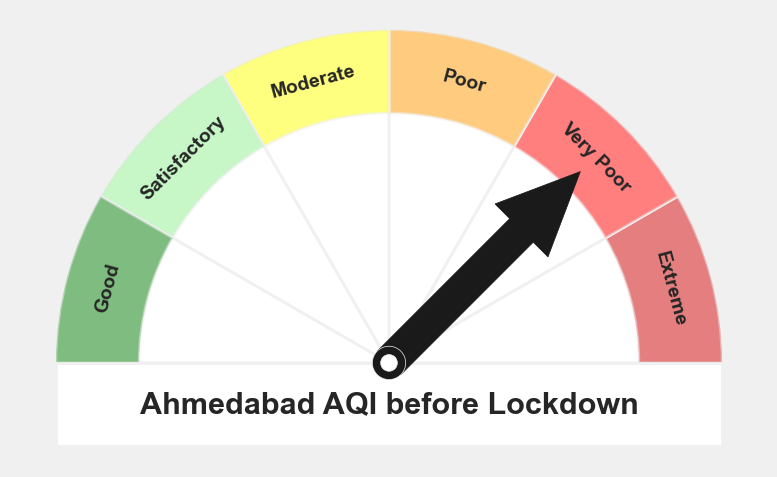

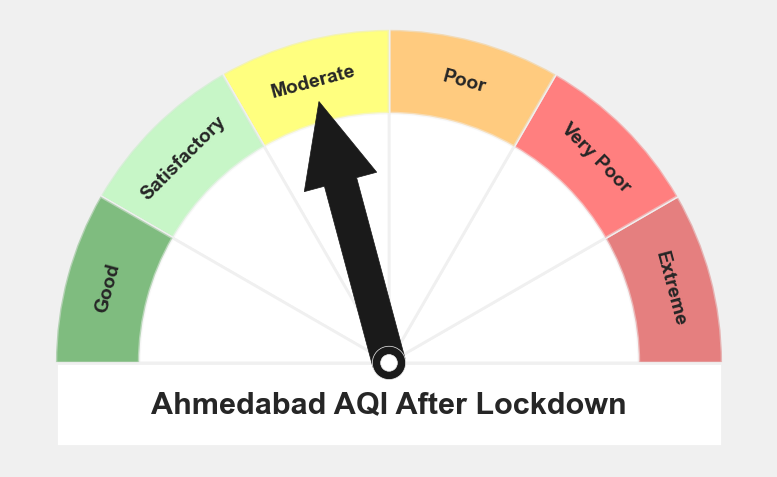

In [61]:
display("Ahmedabad's AQI levels")

gauge(labels=['Good','Satisfactory','Moderate','Poor','Very Poor','Extreme'], 
      colors=['#007A00','#90EE90','#ffff00','#FF9900','#ff0000','#CC0000'], arrow=5, title='Ahmedabad AQI before Lockdown') 

gauge(labels=['Good','Satisfactory','Moderate','Poor','Very Poor','Extreme'], 
      colors=['#007A00','#90EE90','#ffff00','#FF9900','#ff0000','#CC0000'], arrow=3, title='Ahmedabad AQI After Lockdown') 

"Delhi's AQI levels"

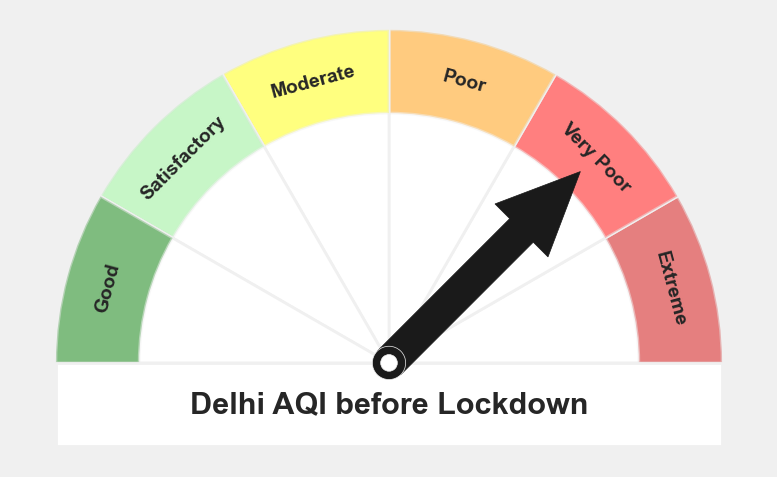

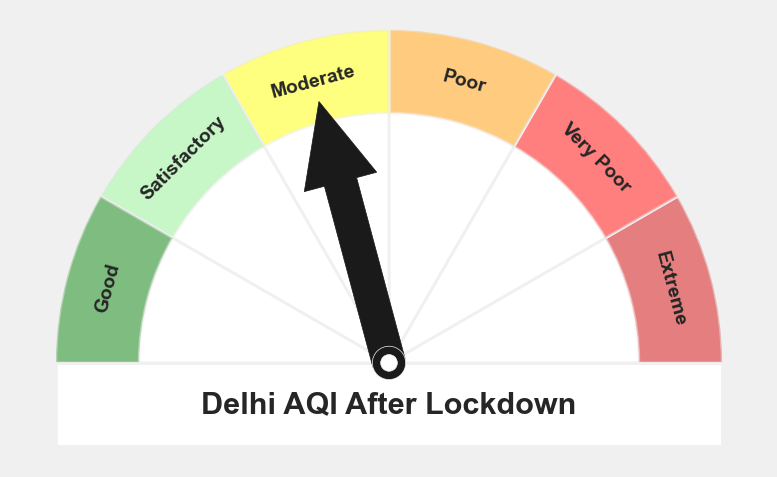

In [62]:
display("Delhi's AQI levels")

gauge(labels=['Good','Satisfactory','Moderate','Poor','Very Poor','Extreme'], 
      colors=['#007A00','#90EE90','#ffff00','#FF9900','#ff0000','#CC0000'], arrow=5, title='Delhi AQI before Lockdown') 

gauge(labels=['Good','Satisfactory','Moderate','Poor','Very Poor','Extreme'], 
      colors=['#007A00','#90EE90','#ffff00','#FF9900','#ff0000','#CC0000'], arrow=3, title='Delhi AQI After Lockdown') 

"Patna's AQI levels"

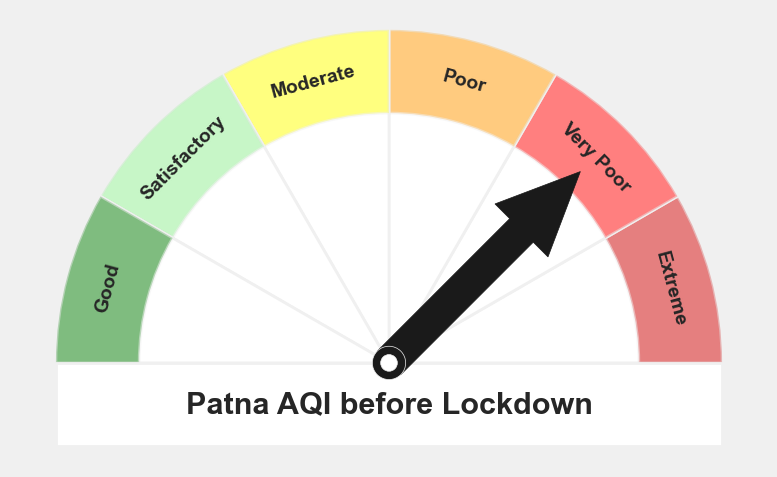

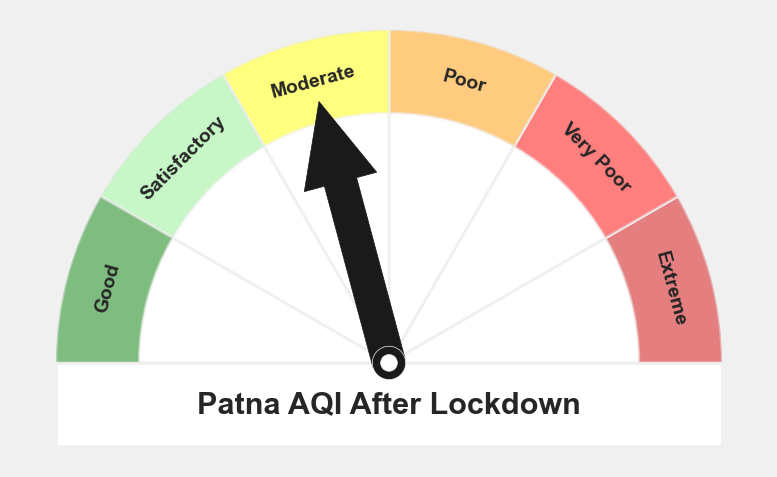

In [63]:
display("Patna's AQI levels")

gauge(labels=['Good','Satisfactory','Moderate','Poor','Very Poor','Extreme'], 
      colors=['#007A00','#90EE90','#ffff00','#FF9900','#ff0000','#CC0000'], arrow=5, title='Patna AQI before Lockdown') 

gauge(labels=['Good','Satisfactory','Moderate','Poor','Very Poor','Extreme'], 
      colors=['#007A00','#90EE90','#ffff00','#FF9900','#ff0000','#CC0000'], arrow=3, title='Patna AQI After Lockdown') 

"Chennai's AQI levels"

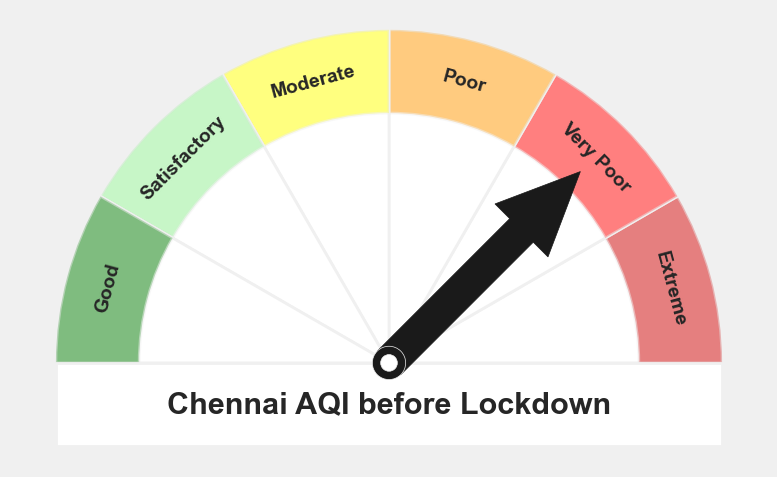

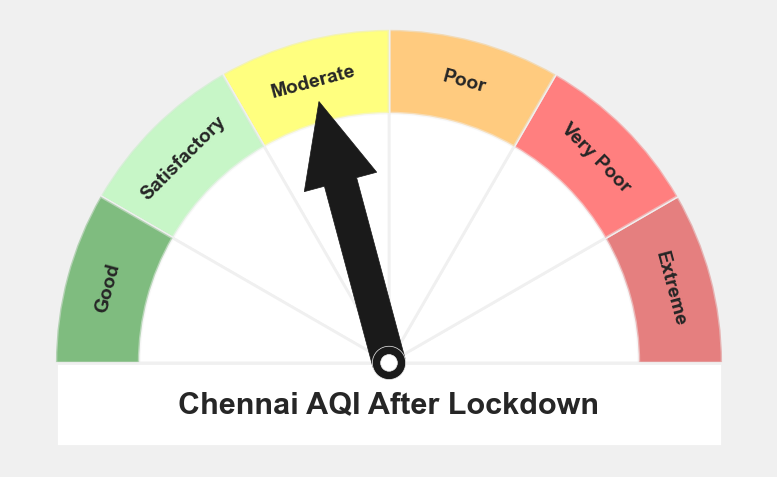

In [64]:
display("Chennai's AQI levels")

gauge(labels=['Good','Satisfactory','Moderate','Poor','Very Poor','Extreme'], 
      colors=['#007A00','#90EE90','#ffff00','#FF9900','#ff0000','#CC0000'], arrow=5, title='Chennai AQI before Lockdown') 

gauge(labels=['Good','Satisfactory','Moderate','Poor','Very Poor','Extreme'], 
      colors=['#007A00','#90EE90','#ffff00','#FF9900','#ff0000','#CC0000'], arrow=3, title='Chennai AQI After Lockdown') 

# Comparison Between pollution levels in 2020,2019 VS 2018

In [65]:
#city_day.set_index('Date',inplace=True)
start_date1='2018-01-01'
end_date1='2018-05-01'

mask1 = (city_day['Date'] >= start_date1) & (city_day['Date']  <= end_date1)
pollutants_filtered_2018= city_day.loc[mask1]
pollutants_filtered_2018.fillna(method='bfill',inplace=True)
pollutants_filtered_2018.set_index('Date',inplace=True);

start_date2 = '2019-01-01'
end_date2 = '2019-05-01'

mask2 = (city_day['Date'] >= start_date2) & (city_day['Date']  <= end_date2)
pollutants_filtered_2019 = city_day.loc[mask2]
pollutants_filtered_2019.fillna(method='bfill',inplace=True)
pollutants_filtered_2019.set_index('Date',inplace=True);

start_date3 = '2020-01-01'
end_date3 = '2020-05-01'

mask3 = (city_day['Date'] >= start_date3) & (city_day['Date']  <= end_date3)
pollutants_filtered_2020 = city_day.loc[mask3]
pollutants_filtered_2020.fillna(method='bfill',inplace=True)
pollutants_filtered_2020.set_index('Date',inplace=True);


df1 = pollutants_filtered_2018[pollutants_filtered_2018.City.isin(cities)][['City','NO2','SO2','PM2.5','CO']]
df2 = pollutants_filtered_2019[pollutants_filtered_2019.City.isin(cities)][['City','NO2','SO2','PM2.5','CO']]
df3 = pollutants_filtered_2020[pollutants_filtered_2020.City.isin(cities)][['City','NO2','SO2','PM2.5','CO']]


In [66]:
def pollution_comparison(city):
    """
    Function to plot graph comparing pollutin levels between (Jan-May)2019 and (Jan-May)2020
    
    """
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df1.index, y=df1[df1['City']==city]['NO2'],
                    line=dict(dash='solid',color='green'),name='NO2'))
    fig.add_trace(go.Scatter(x=df1.index, y=df1[df1['City']==city]['SO2'],
                    line=dict(dash='dot',color='red'),name='SO2'))
    fig.add_trace(go.Scatter(x=df1.index, y=df1[df1['City']==city]['PM2.5'],
                    line=dict(dash='dashdot',color='dodgerblue'),name='Particulate_Matter'))
    fig.add_trace(go.Scatter(x=df1.index, y=df1[df1['City']==city]['CO'],
                    line=dict(dash='longdashdot'),mode='lines',name='CO'))
    fig.update_layout(title_text=city+' 2018 ',plot_bgcolor='white')
    fig.update_xaxes(rangeslider_visible=True,zeroline=True,zerolinewidth=1, zerolinecolor='Black')
    fig.show()

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df2.index, y=df2[df2['City']==city]['NO2'],
                    line=dict(dash='solid',color='green'),name='NO2'))
    fig.add_trace(go.Scatter(x=df2.index, y=df2[df2['City']==city]['SO2'],
                    line=dict(dash='dot',color='red'),name='SO2'))
    fig.add_trace(go.Scatter(x=df2.index, y=df2[df2['City']==city]['PM2.5'],
                    line=dict(dash='dashdot',color='dodgerblue'),name='Particulate_Matter'))
    fig.add_trace(go.Scatter(x=df2.index, y=df2[df2['City']==city]['CO'],
                    line=dict(dash='longdashdot'),mode='lines',name='CO'))
    fig.update_layout(title_text=city+' 2019 ',plot_bgcolor='white')
    fig.update_xaxes(rangeslider_visible=True,zeroline=True,zerolinewidth=1, zerolinecolor='Black')
    fig.show()
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df3.index, y=df3[df3['City']==city]['NO2'],
                    line=dict(dash='solid',color='green'),name='NO2'))
    fig.add_trace(go.Scatter(x=df3.index, y=df3[df3['City']==city]['SO2'],
                    line=dict(dash='dot',color='red'),name='SO2'))
    fig.add_trace(go.Scatter(x=df3.index, y=df3[df3['City']==city]['PM2.5'],
                    line=dict(dash='dashdot',color='dodgerblue'),name='Particulate_Matter'))
    fig.add_trace(go.Scatter(x=df3.index, y=df3[df3['City']==city]['CO'],
                    line=dict(dash='longdashdot'),mode='lines',name='CO'))
    fig.update_layout(title_text=city+' 2020 ',plot_bgcolor='white')
    fig.update_xaxes(rangeslider_visible=True,zeroline=True,zerolinewidth=1, zerolinecolor='Black')
    fig.show()

In [67]:
pollution_comparison('Ahmedabad')

In [68]:
pollution_comparison('Delhi')

In [69]:
pollution_comparison('Chennai')

In [70]:
pollution_comparison('Bengaluru')

# Geographical Analysis Using Dual Maps

In [71]:
df11 = pollutants_filtered_2019[['City','AQI']]
df22 = pollutants_filtered_2020[['City','AQI']]

df_2019_coord = df11.groupby('City')['AQI'].mean().to_frame().reset_index()
df_2020_coord = df22.groupby('City')['AQI'].mean().to_frame().reset_index()

df_2019_AQI = pd.merge(df_2019_coord,city,on='City')
df_2019_AQI['AQI'] = df_2019_AQI['AQI'].round(0)
df_2020_AQI = pd.merge(df_2020_coord,city,on='City')
df_2020_AQI['AQI'] = df_2020_AQI['AQI'].round(0)

In [73]:
m = plugins.DualMap(location=(22.9734, 78.6569), tiles=None, zoom_start=5)

folium.TileLayer('Stamen Toner').add_to(m)
folium.TileLayer('cartodbpositron').add_to(m)


fg_1 = folium.FeatureGroup(name='2019').add_to(m.m1)
fg_2 = folium.FeatureGroup(name='2020').add_to(m.m2)



for lat, lon, value, name in zip(df_2019_AQI['Lat'], df_2019_AQI['Long'], df_2019_AQI['AQI'], df_2019_AQI['City']):
    folium.CircleMarker([lat, lon],
                        radius=10,
                        icon=folium.Icon(color='red'),
                        popup = ('<strong>City</strong>: ' + str(name).capitalize() + '<br>'
                                '<strong>AQI(Average)</strong>: ' + str(value) + '<br>'),
                        fill_color='red',
                        fill_opacity=0.7 ).add_to(fg_1)





for lat, lon, value, name in zip(df_2020_AQI['Lat'], df_2020_AQI['Long'], df_2020_AQI['AQI'], df_2020_AQI['City']):
    folium.CircleMarker([lat, lon],
                        radius=10,
                        icon=folium.Icon(color='orange'),
                        popup = ('<strong>City</strong>: ' + str(name).capitalize() + '<br>'
                                '<strong>AQI(Average)</strong>: ' + str(value) + '<br>'),
                        fill_color='orange',
                        fill_opacity=0.7 ).add_to(fg_2)


folium.LayerControl(collapsed=False).add_to(m)

m


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Load your local data
print(" Loading data from local CSV files...")
city_day = pd.read_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/city_day.csv')
cities = pd.read_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/cities.csv')

print(f" city_day shape: {city_day.shape}")
print(f" city_day columns: {city_day.columns.tolist()}")
print("\n First few rows of city_day:")
print(city_day.head())

# ============== DATE CONVERSION & TIMESERIES PREPARATION ==============
print("\n Converting Date to datetime...")
city_day['Date'] = pd.to_datetime(city_day['Date'], format='%Y-%m-%d')
city_day = city_day.sort_values('Date').reset_index(drop=True)

# Extract temporal features for enrichment
city_day['Year'] = city_day['Date'].dt.year
city_day['Month'] = city_day['Date'].dt.month
city_day['Day'] = city_day['Date'].dt.day
city_day['DayOfWeek'] = city_day['Date'].dt.dayofweek

print(f" Date range: {city_day['Date'].min()} to {city_day['Date'].max()}")

# ============== COVID-19 SPLIT ==============
covid_date = pd.to_datetime('2020-03-24')
print(f"\n COVID-19 lockdown date: {covid_date}")
print(f" Data before COVID: {len(city_day[city_day['Date'] < covid_date])} records")
print(f" Data after COVID: {len(city_day[city_day['Date'] >= covid_date])} records")

# ============== DATA AGGREGATION ==============
# Aggregate by date (all cities combined) for better timeseries
print("\n Aggregating data by date across all cities...")
aqi_features = ['PM2.5', 'PM10', 'NO2', 'NOx', 'CO', 'SO2', 'AQI']

# Handle missing values and aggregate
aggregated_data = city_day.groupby('Date')[aqi_features].mean().reset_index()

# Fill remaining NaN values with forward fill then backward fill
aggregated_data = aggregated_data.fillna(method='ffill').fillna(method='bfill')

print(f" Aggregated data shape: {aggregated_data.shape}")
print(f" Final data:\n{aggregated_data.head()}")

# Save aggregated data
aggregated_data.to_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aggregated_aqi_data.csv', index=False)
print("\n D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aggregated_aqi_data.csv")

# ============== VISUALIZATION ==============
print("\n Creating visualizations...")
fig, axes = plt.subplots(2, 1, figsize=(14, 8))

# Plot AQI over time with COVID marker
axes[0].plot(aggregated_data['Date'], aggregated_data['AQI'], linewidth=2, color='#2E86AB')
axes[0].axvline(covid_date, color='red', linestyle='--', linewidth=2, label='COVID-19 Lockdown')
axes[0].set_title('AQI Over Time (Before & After COVID)', fontsize=14, fontweight='bold')
axes[0].set_ylabel('AQI', fontsize=12)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot pollutants over time
for pollutant in ['PM2.5', 'PM10', 'NO2', 'SO2']:
    axes[1].plot(aggregated_data['Date'], aggregated_data[pollutant], label=pollutant, linewidth=1.5)
axes[1].axvline(covid_date, color='red', linestyle='--', linewidth=2, label='COVID-19')
axes[1].set_title('Primary Pollutants Over Time', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Date', fontsize=12)
axes[1].set_ylabel('Concentration', fontsize=12)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aqi_timeseries_overview.png', dpi=300, bbox_inches='tight')
print(" Visualization saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aqi_timeseries_overview.png")
plt.close()

print("\n Data preparation complete!")


[v0] Loading data from local CSV files...
[v0] city_day shape: (29531, 16)
[v0] city_day columns: ['City', 'Date', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI', 'AQI_Bucket']

[v0] First few rows of city_day:
        City        Date  PM2.5  PM10     NO    NO2    NOx  NH3     CO    SO2  \
0  Ahmedabad  2015-01-01    NaN   NaN   0.92  18.22  17.15  NaN   0.92  27.64   
1  Ahmedabad  2015-01-02    NaN   NaN   0.97  15.69  16.46  NaN   0.97  24.55   
2  Ahmedabad  2015-01-03    NaN   NaN  17.40  19.30  29.70  NaN  17.40  29.07   
3  Ahmedabad  2015-01-04    NaN   NaN   1.70  18.48  17.97  NaN   1.70  18.59   
4  Ahmedabad  2015-01-05    NaN   NaN  22.10  21.42  37.76  NaN  22.10  39.33   

       O3  Benzene  Toluene  Xylene  AQI AQI_Bucket  
0  133.36     0.00     0.02    0.00  NaN        NaN  
1   34.06     3.68     5.50    3.77  NaN        NaN  
2   30.70     6.80    16.40    2.25  NaN        NaN  
3   36.08     4.43    10.14    1

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

print("="*70)
print("LSTM MODEL 1: BEFORE COVID-19 (PRE-2020-03-24)")
print("="*70)

aggregated_data = pd.read_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aggregated_aqi_data.csv')
aggregated_data['Date'] = pd.to_datetime(aggregated_data['Date'])

# Filter: Before COVID
covid_date = pd.to_datetime('2020-03-24')
before_covid = aggregated_data[aggregated_data['Date'] < covid_date].copy()

print(f"\n Before COVID data shape: {before_covid.shape}")
print(f" Date range: {before_covid['Date'].min()} to {before_covid['Date'].max()}")

# Features for LSTM (pollution indicators)
features = ['PM2.5', 'PM10', 'NO2', 'NOx', 'CO', 'SO2']
target = 'AQI'

X = before_covid[features].values
y = before_covid[target].values.reshape(-1, 1)

print(f" Features shape: {X.shape}, Target shape: {y.shape}")

# Scaling
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_scaled = scaler_X.fit_transform(X)
y_scaled = scaler_y.fit_transform(y)

# Create sequences for LSTM (lookback window = 30 days)
lookback = 30

def create_sequences(X, y, lookback):
    X_seq, y_seq = [], []
    for i in range(len(X) - lookback):
        X_seq.append(X[i:i+lookback])
        y_seq.append(y[i+lookback])
    return np.array(X_seq), np.array(y_seq)

X_seq, y_seq = create_sequences(X_scaled, y_scaled, lookback)
print(f" Sequences shape: X={X_seq.shape}, y={y_seq.shape}")

# Train-test split
split_idx = int(0.8 * len(X_seq))
X_train, X_test = X_seq[:split_idx], X_seq[split_idx:]
y_train, y_test = y_seq[:split_idx], y_seq[split_idx:]

print(f" Train: X={X_train.shape}, y={y_train.shape}")
print(f" Test: X={X_test.shape}, y={y_test.shape}")

# Build LSTM model
print("\n Building LSTM model...")
model = Sequential([
    LSTM(64, activation='relu', input_shape=(lookback, len(features)), return_sequences=True),
    Dropout(0.2),
    LSTM(32, activation='relu', return_sequences=False),
    Dropout(0.2),
    Dense(16, activation='relu'),
    Dense(1)
])

model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])
print(model.summary())

# Train model
print("\n Training LSTM model (Before COVID)...")
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_split=0.2,
    verbose=1
)

# Predictions
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse scaling
y_train_actual = scaler_y.inverse_transform(y_train)
y_test_actual = scaler_y.inverse_transform(y_test)
y_pred_train_actual = scaler_y.inverse_transform(y_pred_train)
y_pred_test_actual = scaler_y.inverse_transform(y_pred_test)

# Metrics
train_rmse = np.sqrt(mean_squared_error(y_train_actual, y_pred_train_actual))
test_rmse = np.sqrt(mean_squared_error(y_test_actual, y_pred_test_actual))
test_mae = mean_absolute_error(y_test_actual, y_pred_test_actual)
test_r2 = r2_score(y_test_actual, y_pred_test_actual)

print(f"\n BEFORE COVID MODEL PERFORMANCE:")
print(f"  Train RMSE: {train_rmse:.4f}")
print(f"  Test RMSE: {test_rmse:.4f}")
print(f"  Test MAE: {test_mae:.4f}")
print(f"  Test R²: {test_r2:.4f}")

model.save('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_before_covid.keras')
print(" Model saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_before_covid.keras")

# Visualization
fig, axes = plt.subplots(2, 1, figsize=(14, 8))

# Training history
axes[0].plot(history.history['loss'], label='Train Loss', linewidth=2)
axes[0].plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
axes[0].set_title('LSTM Before COVID - Training History', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Loss', fontsize=11)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Predictions vs Actual
axes[1].plot(y_test_actual, label='Actual AQI', linewidth=2, marker='o', markersize=4)
axes[1].plot(y_pred_test_actual, label='Predicted AQI', linewidth=2, marker='s', markersize=4)
axes[1].set_title(f'Before COVID - Test Predictions (RMSE: {test_rmse:.4f})', fontsize=12, fontweight='bold')
axes[1].set_ylabel('AQI', fontsize=11)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_before_covid_results.png', dpi=300, bbox_inches='tight')
print(" Results saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_before_covid_results.png")
plt.close()



LSTM MODEL 1: BEFORE COVID-19 (PRE-2020-03-24)

[v0] Before COVID data shape: (1909, 8)
[v0] Date range: 2015-01-01 00:00:00 to 2020-03-23 00:00:00
[v0] Features shape: (1909, 6), Target shape: (1909, 1)
[v0] Sequences shape: X=(1879, 30, 6), y=(1879, 1)
[v0] Train: X=(1503, 30, 6), y=(1503, 1)
[v0] Test: X=(376, 30, 6), y=(376, 1)

[v0] Building LSTM model...


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                   │ (None, 30, 64)         │        18,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 30, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_7 (LSTM)                   │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,137 (121.63 KB)

 Trainable params: 31,137 (121.63 KB)

 Non-trainable params: 0 (0.00 B)

None

[v0] Training LSTM model (Before COVID)...
Epoch 1/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0113 - mae: 0.0771 - val_loss: 0.0045 - val_mae: 0.0561
Epoch 2/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0059 - mae: 0.0522 - val_loss: 0.0037 - val_mae: 0.0495
Epoch 3/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0052 - mae: 0.0510 - val_loss: 0.0036 - val_mae: 0.0484
Epoch 4/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.0050 - mae: 0.0488 - val_loss: 0.0035 - val_mae: 0.0476
Epoch 5/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0046 - mae: 0.0459 - val_loss: 0.0034 - val_mae: 0.0461
Epoch 6/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.0043 - mae: 0.0445 - val_loss: 0.0035 - val_mae: 0.0459
Epoch 7/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - loss: 0.0045 - mae: 0.0450 - val_loss: 0.0032 - val_mae: 0.0446
Epoch 8/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.0043 - mae: 0.0439 - val_loss: 0.0035 - val_mae: 0.0472
Epoch 9/50
38/

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

print("="*70)
print("LSTM MODEL 2: AFTER COVID-19 (POST-2020-03-24)")
print("="*70)

aggregated_data = pd.read_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aggregated_aqi_data.csv')
aggregated_data['Date'] = pd.to_datetime(aggregated_data['Date'])

# Filter: After COVID
covid_date = pd.to_datetime('2020-03-24')
after_covid = aggregated_data[aggregated_data['Date'] >= covid_date].copy()

print(f"\n After COVID data shape: {after_covid.shape}")
print(f" Date range: {after_covid['Date'].min()} to {after_covid['Date'].max()}")

# Features for LSTM
features = ['PM2.5', 'PM10', 'NO2', 'NOx', 'CO', 'SO2']
target = 'AQI'

X = after_covid[features].values
y = after_covid[target].values.reshape(-1, 1)

print(f" Features shape: {X.shape}, Target shape: {y.shape}")

# Scaling
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_scaled = scaler_X.fit_transform(X)
y_scaled = scaler_y.fit_transform(y)

# Create sequences for LSTM (lookback window = 30 days)
lookback = 30

def create_sequences(X, y, lookback):
    X_seq, y_seq = [], []
    for i in range(len(X) - lookback):
        X_seq.append(X[i:i+lookback])
        y_seq.append(y[i+lookback])
    return np.array(X_seq), np.array(y_seq)

X_seq, y_seq = create_sequences(X_scaled, y_scaled, lookback)
print(f" Sequences shape: X={X_seq.shape}, y={y_seq.shape}")

# Train-test split
split_idx = int(0.8 * len(X_seq))
X_train, X_test = X_seq[:split_idx], X_seq[split_idx:]
y_train, y_test = y_seq[:split_idx], y_seq[split_idx:]

print(f" Train: X={X_train.shape}, y={y_train.shape}")
print(f" Test: X={X_test.shape}, y={y_test.shape}")

# Build LSTM model
print("\n Building LSTM model...")
model = Sequential([
    LSTM(64, activation='relu', input_shape=(lookback, len(features)), return_sequences=True),
    Dropout(0.2),
    LSTM(32, activation='relu', return_sequences=False),
    Dropout(0.2),
    Dense(16, activation='relu'),
    Dense(1)
])

model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])
print(model.summary())

# Train model
print("\n Training LSTM model (After COVID)...")
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_split=0.2,
    verbose=1
)

# Predictions
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse scaling
y_train_actual = scaler_y.inverse_transform(y_train)
y_test_actual = scaler_y.inverse_transform(y_test)
y_pred_train_actual = scaler_y.inverse_transform(y_pred_train)
y_pred_test_actual = scaler_y.inverse_transform(y_pred_test)

# Metrics
train_rmse = np.sqrt(mean_squared_error(y_train_actual, y_pred_train_actual))
test_rmse = np.sqrt(mean_squared_error(y_test_actual, y_pred_test_actual))
test_mae = mean_absolute_error(y_test_actual, y_pred_test_actual)
test_r2 = r2_score(y_test_actual, y_pred_test_actual)

print(f"\n AFTER COVID MODEL PERFORMANCE:")
print(f"  Train RMSE: {train_rmse:.4f}")
print(f"  Test RMSE: {test_rmse:.4f}")
print(f"  Test MAE: {test_mae:.4f}")
print(f"  Test R²: {test_r2:.4f}")

model.save('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_after_covid.keras')
print(" Model saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_after_covid.keras")

# Visualization
fig, axes = plt.subplots(2, 1, figsize=(14, 8))

# Training history
axes[0].plot(history.history['loss'], label='Train Loss', linewidth=2)
axes[0].plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
axes[0].set_title('LSTM After COVID - Training History', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Loss', fontsize=11)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Predictions vs Actual
axes[1].plot(y_test_actual, label='Actual AQI', linewidth=2, marker='o', markersize=4)
axes[1].plot(y_pred_test_actual, label='Predicted AQI', linewidth=2, marker='s', markersize=4)
axes[1].set_title(f'After COVID - Test Predictions (RMSE: {test_rmse:.4f})', fontsize=12, fontweight='bold')
axes[1].set_ylabel('AQI', fontsize=11)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_after_covid_results.png', dpi=300, bbox_inches='tight')
print(" Results saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_after_covid_results.png")
plt.close()



LSTM MODEL 2: AFTER COVID-19 (POST-2020-03-24)

[v0] After COVID data shape: (100, 8)
[v0] Date range: 2020-03-24 00:00:00 to 2020-07-01 00:00:00
[v0] Features shape: (100, 6), Target shape: (100, 1)
[v0] Sequences shape: X=(70, 30, 6), y=(70, 1)
[v0] Train: X=(56, 30, 6), y=(56, 1)
[v0] Test: X=(14, 30, 6), y=(14, 1)

[v0] Building LSTM model...


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_8 (LSTM)                   │ (None, 30, 64)         │        18,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 30, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_9 (LSTM)                   │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,137 (121.63 KB)

 Trainable params: 31,137 (121.63 KB)

 Non-trainable params: 0 (0.00 B)

None

[v0] Training LSTM model (After COVID)...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 435ms/step - loss: 0.1729 - mae: 0.3773 - val_loss: 0.0358 - val_mae: 0.1439
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1448 - mae: 0.3368 - val_loss: 0.0244 - val_mae: 0.1200
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1083 - mae: 0.2880 - val_loss: 0.0157 - val_mae: 0.1096
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0813 - mae: 0.2419 - val_loss: 0.0180 - val_mae: 0.1234
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.0625 - mae: 0.2097 - val_loss: 0.0418 - val_mae: 0.1663
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0543 - mae: 0.1946 - val_loss: 0.0861 - val_mae: 0.2679
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0720 - mae: 0.2106 - val_loss: 0.0840 - val_mae: 0.2641
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.0590 - mae: 0.1875 - val_loss: 0.0636 - val_mae: 0.2218
Epoch 9/50
2/2 ━━━━━━━━━━

In [ ]:
## LSTM ALL TIME DATA

import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

print("="*70)
print("LSTM MODEL 3: ALL TIME DATA (2015-2020)")
print("="*70)

aggregated_data = pd.read_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aggregated_aqi_data.csv')
aggregated_data['Date'] = pd.to_datetime(aggregated_data['Date'])

print(f"\n Full dataset shape: {aggregated_data.shape}")
print(f" Date range: {aggregated_data['Date'].min()} to {aggregated_data['Date'].max()}")

# Features for LSTM
features = ['PM2.5', 'PM10', 'NO2', 'NOx', 'CO', 'SO2']
target = 'AQI'

X = aggregated_data[features].values
y = aggregated_data[target].values.reshape(-1, 1)

print(f" Features shape: {X.shape}, Target shape: {y.shape}")

# Scaling
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_scaled = scaler_X.fit_transform(X)
y_scaled = scaler_y.fit_transform(y)

# Create sequences for LSTM (lookback window = 30 days)
lookback = 30

def create_sequences(X, y, lookback):
    X_seq, y_seq = [], []
    for i in range(len(X) - lookback):
        X_seq.append(X[i:i+lookback])
        y_seq.append(y[i+lookback])
    return np.array(X_seq), np.array(y_seq)

X_seq, y_seq = create_sequences(X_scaled, y_scaled, lookback)
print(f" Sequences shape: X={X_seq.shape}, y={y_seq.shape}")

# Train-test split
split_idx = int(0.8 * len(X_seq))
X_train, X_test = X_seq[:split_idx], X_seq[split_idx:]
y_train, y_test = y_seq[:split_idx], y_seq[split_idx:]

print(f" Train: X={X_train.shape}, y={y_train.shape}")
print(f" Test: X={X_test.shape}, y={y_test.shape}")

# Build LSTM model
print("\n Building LSTM model...")
model = Sequential([
    LSTM(64, activation='relu', input_shape=(lookback, len(features)), return_sequences=True),
    Dropout(0.2),
    LSTM(32, activation='relu', return_sequences=False),
    Dropout(0.2),
    Dense(16, activation='relu'),
    Dense(1)
])

model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])
print(model.summary())

# Train model
print("\n Training LSTM model (All Time)...")
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_split=0.2,
    verbose=1
)

# Predictions
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse scaling
y_train_actual = scaler_y.inverse_transform(y_train)
y_test_actual = scaler_y.inverse_transform(y_test)
y_pred_train_actual = scaler_y.inverse_transform(y_pred_train)
y_pred_test_actual = scaler_y.inverse_transform(y_pred_test)

# Metrics
train_rmse = np.sqrt(mean_squared_error(y_train_actual, y_pred_train_actual))
test_rmse = np.sqrt(mean_squared_error(y_test_actual, y_pred_test_actual))
test_mae = mean_absolute_error(y_test_actual, y_pred_test_actual)
test_r2 = r2_score(y_test_actual, y_pred_test_actual)

print(f"\n ALL TIME MODEL PERFORMANCE:")
print(f"  Train RMSE: {train_rmse:.4f}")
print(f"  Test RMSE: {test_rmse:.4f}")
print(f"  Test MAE: {test_mae:.4f}")
print(f"  Test R²: {test_r2:.4f}")

model.save('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_all_time.keras')
print(" Model saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_all_time.keras")

# Visualization
fig, axes = plt.subplots(2, 1, figsize=(14, 8))

# Training history
axes[0].plot(history.history['loss'], label='Train Loss', linewidth=2)
axes[0].plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
axes[0].set_title('LSTM All Time - Training History', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Loss', fontsize=11)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Predictions vs Actual
axes[1].plot(y_test_actual, label='Actual AQI', linewidth=2, marker='o', markersize=4)
axes[1].plot(y_pred_test_actual, label='Predicted AQI', linewidth=2, marker='s', markersize=4)
axes[1].set_title(f'All Time - Test Predictions (RMSE: {test_rmse:.4f})', fontsize=12, fontweight='bold')
axes[1].set_ylabel('AQI', fontsize=11)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_all_time_results.png', dpi=300, bbox_inches='tight')
print(" Results saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_all_time_results.png")
plt.close()


LSTM MODEL 3: ALL TIME DATA (2015-2020)

[v0] Full dataset shape: (2009, 8)
[v0] Date range: 2015-01-01 00:00:00 to 2020-07-01 00:00:00
[v0] Features shape: (2009, 6), Target shape: (2009, 1)
[v0] Sequences shape: X=(1979, 30, 6), y=(1979, 1)
[v0] Train: X=(1583, 30, 6), y=(1583, 1)
[v0] Test: X=(396, 30, 6), y=(396, 1)

[v0] Building LSTM model...


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_10 (LSTM)                  │ (None, 30, 64)         │        18,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 30, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_11 (LSTM)                  │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,137 (121.63 KB)

 Trainable params: 31,137 (121.63 KB)

 Non-trainable params: 0 (0.00 B)

None

[v0] Training LSTM model (All Time)...
Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.0130 - mae: 0.0813 - val_loss: 0.0051 - val_mae: 0.0620
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.0064 - mae: 0.0554 - val_loss: 0.0026 - val_mae: 0.0382
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0059 - mae: 0.0523 - val_loss: 0.0028 - val_mae: 0.0393
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 0.0047 - mae: 0.0479 - val_loss: 0.0028 - val_mae: 0.0401
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - loss: 0.0052 - mae: 0.0481 - val_loss: 0.0027 - val_mae: 0.0401
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 0.0047 - mae: 0.0473 - val_loss: 0.0028 - val_mae: 0.0407
Epoch 7/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.0044 - mae: 0.0458 - val_loss: 0.0028 - val_mae: 0.0408
Epoch 8/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 0.0047 - mae: 0.0468 - val_loss: 0.0027 - val_mae: 0.0404
Epoch 9/50
40/40 ━━

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import warnings
warnings.filterwarnings('ignore')

print("="*70)
print("MODEL COMPARISON: BEFORE COVID vs AFTER COVID vs ALL TIME")
print("="*70)

# Load all three models
print("\n Loading trained models...")
try:
    model_before = load_model('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_before_covid.keras')
    model_after = load_model('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_after_covid.keras')
    model_all = load_model('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_all_time.keras')
    print(" All models loaded successfully!")
except FileNotFoundError as e:
    print(f" Error: Model file not found. Make sure to run scripts 2, 3, and 4 first.")
    print(f" Error details: {e}")
    exit(1)
except Exception as e:
    print(f" Error loading models: {e}")
    exit(1)

# Reload data for evaluation
aggregated_data = pd.read_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aggregated_aqi_data.csv')
aggregated_data['Date'] = pd.to_datetime(aggregated_data['Date'])

covid_date = pd.to_datetime('2020-03-24')
features = ['PM2.5', 'PM10', 'NO2', 'NOx', 'CO', 'SO2']
lookback = 30

# Function to prepare sequences
def create_sequences(X, y, lookback):
    X_seq, y_seq = [], []
    for i in range(len(X) - lookback):
        X_seq.append(X[i:i+lookback])
        y_seq.append(y[i+lookback])
    return np.array(X_seq), np.array(y_seq)

# ============== BEFORE COVID EVALUATION ==============
print("\n" + "="*70)
print("BEFORE COVID MODEL")
print("="*70)
before_covid = aggregated_data[aggregated_data['Date'] < covid_date].copy()
X_before = before_covid[features].values
y_before = before_covid['AQI'].values.reshape(-1, 1)

scaler_X_before = MinMaxScaler()
scaler_y_before = MinMaxScaler()
X_before_scaled = scaler_X_before.fit_transform(X_before)
y_before_scaled = scaler_y_before.fit_transform(y_before)

X_before_seq, y_before_seq = create_sequences(X_before_scaled, y_before_scaled, lookback)
split_idx_before = int(0.8 * len(X_before_seq))
X_before_test = X_before_seq[split_idx_before:]
y_before_test = y_before_seq[split_idx_before:]

y_before_pred = model_before.predict(X_before_test, verbose=0)
y_before_test_actual = scaler_y_before.inverse_transform(y_before_test)
y_before_pred_actual = scaler_y_before.inverse_transform(y_before_pred)

before_rmse = np.sqrt(mean_squared_error(y_before_test_actual, y_before_pred_actual))
before_mae = mean_absolute_error(y_before_test_actual, y_before_pred_actual)
before_r2 = r2_score(y_before_test_actual, y_before_pred_actual)

print(f"RMSE: {before_rmse:.4f}")
print(f"MAE: {before_mae:.4f}")
print(f"R² Score: {before_r2:.4f}")

# ============== AFTER COVID EVALUATION ==============
print("\n" + "="*70)
print("AFTER COVID MODEL")
print("="*70)
after_covid = aggregated_data[aggregated_data['Date'] >= covid_date].copy()
X_after = after_covid[features].values
y_after = after_covid['AQI'].values.reshape(-1, 1)

scaler_X_after = MinMaxScaler()
scaler_y_after = MinMaxScaler()
X_after_scaled = scaler_X_after.fit_transform(X_after)
y_after_scaled = scaler_y_after.fit_transform(y_after)

X_after_seq, y_after_seq = create_sequences(X_after_scaled, y_after_scaled, lookback)
split_idx_after = int(0.8 * len(X_after_seq))
X_after_test = X_after_seq[split_idx_after:]
y_after_test = y_after_seq[split_idx_after:]

y_after_pred = model_after.predict(X_after_test, verbose=0)
y_after_test_actual = scaler_y_after.inverse_transform(y_after_test)
y_after_pred_actual = scaler_y_after.inverse_transform(y_after_pred)

after_rmse = np.sqrt(mean_squared_error(y_after_test_actual, y_after_pred_actual))
after_mae = mean_absolute_error(y_after_test_actual, y_after_pred_actual)
after_r2 = r2_score(y_after_test_actual, y_after_pred_actual)

print(f"RMSE: {after_rmse:.4f}")
print(f"MAE: {after_mae:.4f}")
print(f"R² Score: {after_r2:.4f}")

# ============== ALL TIME EVALUATION ==============
print("\n" + "="*70)
print("ALL TIME MODEL")
print("="*70)
X_all = aggregated_data[features].values
y_all = aggregated_data['AQI'].values.reshape(-1, 1)

scaler_X_all = MinMaxScaler()
scaler_y_all = MinMaxScaler()
X_all_scaled = scaler_X_all.fit_transform(X_all)
y_all_scaled = scaler_y_all.fit_transform(y_all)

X_all_seq, y_all_seq = create_sequences(X_all_scaled, y_all_scaled, lookback)
split_idx_all = int(0.8 * len(X_all_seq))
X_all_test = X_all_seq[split_idx_all:]
y_all_test = y_all_seq[split_idx_all:]

y_all_pred = model_all.predict(X_all_test, verbose=0)
y_all_test_actual = scaler_y_all.inverse_transform(y_all_test)
y_all_pred_actual = scaler_y_all.inverse_transform(y_all_pred)

all_rmse = np.sqrt(mean_squared_error(y_all_test_actual, y_all_pred_actual))
all_mae = mean_absolute_error(y_all_test_actual, y_all_pred_actual)
all_r2 = r2_score(y_all_test_actual, y_all_pred_actual)

print(f"RMSE: {all_rmse:.4f}")
print(f"MAE: {all_mae:.4f}")
print(f"R² Score: {all_r2:.4f}")

# ============== COMPARISON VISUALIZATION ==============
print("\n Creating comparison visualizations...")

fig = plt.figure(figsize=(16, 10))
gs = fig.add_gridspec(3, 2, hspace=0.3, wspace=0.3)

# Before COVID
ax1 = fig.add_subplot(gs[0, 0])
ax1.plot(y_before_test_actual, label='Actual', linewidth=2, marker='o', markersize=3)
ax1.plot(y_before_pred_actual, label='Predicted', linewidth=2, marker='s', markersize=3)
ax1.set_title(f'Before COVID (RMSE: {before_rmse:.4f})', fontweight='bold')
ax1.set_ylabel('AQI')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Before COVID residuals
ax2 = fig.add_subplot(gs[0, 1])
residuals_before = y_before_test_actual - y_before_pred_actual
ax2.hist(residuals_before, bins=30, alpha=0.7, color='steelblue', edgecolor='black')
ax2.set_title(f'Before COVID - Residuals (MAE: {before_mae:.4f})', fontweight='bold')
ax2.set_xlabel('Residuals')
ax2.grid(True, alpha=0.3, axis='y')

# After COVID
ax3 = fig.add_subplot(gs[1, 0])
ax3.plot(y_after_test_actual, label='Actual', linewidth=2, marker='o', markersize=3)
ax3.plot(y_after_pred_actual, label='Predicted', linewidth=2, marker='s', markersize=3)
ax3.set_title(f'After COVID (RMSE: {after_rmse:.4f})', fontweight='bold')
ax3.set_ylabel('AQI')
ax3.legend()
ax3.grid(True, alpha=0.3)

# After COVID residuals
ax4 = fig.add_subplot(gs[1, 1])
residuals_after = y_after_test_actual - y_after_pred_actual
ax4.hist(residuals_after, bins=30, alpha=0.7, color='coral', edgecolor='black')
ax4.set_title(f'After COVID - Residuals (MAE: {after_mae:.4f})', fontweight='bold')
ax4.set_xlabel('Residuals')
ax4.grid(True, alpha=0.3, axis='y')

# All Time
ax5 = fig.add_subplot(gs[2, 0])
ax5.plot(y_all_test_actual, label='Actual', linewidth=2, marker='o', markersize=3)
ax5.plot(y_all_pred_actual, label='Predicted', linewidth=2, marker='s', markersize=3)
ax5.set_title(f'All Time (RMSE: {all_rmse:.4f})', fontweight='bold')
ax5.set_xlabel('Test Samples')
ax5.set_ylabel('AQI')
ax5.legend()
ax5.grid(True, alpha=0.3)

# All Time residuals
ax6 = fig.add_subplot(gs[2, 1])
residuals_all = y_all_test_actual - y_all_pred_actual
ax6.hist(residuals_all, bins=30, alpha=0.7, color='green', edgecolor='black')
ax6.set_title(f'All Time - Residuals (MAE: {all_mae:.4f})', fontweight='bold')
ax6.set_xlabel('Residuals')
ax6.grid(True, alpha=0.3, axis='y')

plt.savefig('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/model_comparison_detailed.png', dpi=300, bbox_inches='tight')
print(" Detailed comparison saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/model_comparison_detailed.png")
plt.close()

# Summary comparison metrics
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

models = ['Before COVID', 'After COVID', 'All Time']
rmse_values = [before_rmse, after_rmse, all_rmse]
mae_values = [before_mae, after_mae, all_mae]
r2_values = [before_r2, after_r2, all_r2]

colors = ['#FF6B6B', '#4ECDC4', '#45B7D1']

# RMSE comparison
axes[0].bar(models, rmse_values, color=colors, edgecolor='black', linewidth=1.5)
axes[0].set_title('RMSE Comparison', fontweight='bold', fontsize=12)
axes[0].set_ylabel('RMSE')
for i, v in enumerate(rmse_values):
    axes[0].text(i, v + 0.1, f'{v:.4f}', ha='center', fontweight='bold')
axes[0].grid(True, alpha=0.3, axis='y')

# MAE comparison
axes[1].bar(models, mae_values, color=colors, edgecolor='black', linewidth=1.5)
axes[1].set_title('MAE Comparison', fontweight='bold', fontsize=12)
axes[1].set_ylabel('MAE')
for i, v in enumerate(mae_values):
    axes[1].text(i, v + 0.1, f'{v:.4f}', ha='center', fontweight='bold')
axes[1].grid(True, alpha=0.3, axis='y')

# R² comparison
axes[2].bar(models, r2_values, color=colors, edgecolor='black', linewidth=1.5)
axes[2].set_title('R² Score Comparison', fontweight='bold', fontsize=12)
axes[2].set_ylabel('R² Score')
for i, v in enumerate(r2_values):
    axes[2].text(i, v + 0.01, f'{v:.4f}', ha='center', fontweight='bold')
axes[2].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/model_metrics_comparison.png', dpi=300, bbox_inches='tight')
print(" Metrics comparison saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/model_metrics_comparison.png")
plt.close()

# Summary table
print("\n" + "="*70)
print("SUMMARY TABLE")
print("="*70)
summary_df = pd.DataFrame({
    'Model': models,
    'RMSE': rmse_values,
    'MAE': mae_values,
    'R² Score': r2_values
})
print(summary_df.to_string(index=False))
summary_df.to_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/model_comparison_summary.csv', index=False)
print("\n Summary saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/model_comparison_summary.csv")


MODEL COMPARISON: BEFORE COVID vs AFTER COVID vs ALL TIME

[v0] Loading trained models...
[v0] All models loaded successfully!

BEFORE COVID MODEL
RMSE: 22.4882
MAE: 18.2906
R² Score: 0.6533

AFTER COVID MODEL
RMSE: 5.1514
MAE: 4.4138
R² Score: -1.5864

ALL TIME MODEL
RMSE: 36.6361
MAE: 31.5175
R² Score: 0.2759

[v0] Creating comparison visualizations...
[v0] Detailed comparison saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/model_comparison_detailed.png
[v0] Metrics comparison saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/model_metrics_comparison.png

SUMMARY TABLE
       Model      RMSE       MAE  R² Score
Before COVID 22.488197 18.290638  0.653296
 After COVID  5.151399  4.413799 -1.586417
    All Time 36.636090 31.517484  0.275935

[v0] Summary saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/model_comparison_summary.csv


In [67]:
print(all_mae)
print(all_r2)

31.517484027794392
0.275934677552097


In [ ]:
### PREDICTION FOR NEXT 3 MONTHS

print("="*80)
print("AQI PREDICTION FOR NEXT 3 MONTHS")
print("="*80)

print("\n Loading trained models...")
try:
    model_before = load_model('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_before_covid.keras')
    model_after = load_model('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_after_covid.keras')
    model_all = load_model('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_all_time.keras')
    print(" All models loaded successfully!")
except FileNotFoundError as e:
    print(f" Error: Model file not found. Make sure to run scripts 2, 3, and 4 first.")
    exit(1)

# Load aggregated data
aggregated_data = pd.read_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aggregated_aqi_data.csv')
aggregated_data['Date'] = pd.to_datetime(aggregated_data['Date'])
aggregated_data = aggregated_data.sort_values('Date').reset_index(drop=True)

print(f"\n Data loaded. Last date in training data: {aggregated_data['Date'].iloc[-1]}")

features = ['PM2.5', 'PM10', 'NO2', 'NOx', 'CO', 'SO2']
lookback = 30
covid_date = pd.to_datetime('2020-03-24')
last_date = aggregated_data['Date'].iloc[-1]
prediction_days = 90  # 3 months

print("\n Preparing scalers from historical data...")
X_all = aggregated_data[features].values
y_all = aggregated_data['AQI'].values.reshape(-1, 1)

scaler_X_all = MinMaxScaler()
scaler_y_all = MinMaxScaler()
X_all_scaled = scaler_X_all.fit_transform(X_all)
y_all_scaled = scaler_y_all.fit_transform(y_all)

# Before COVID scalers
before_covid_data = aggregated_data[aggregated_data['Date'] < covid_date]
X_before = before_covid_data[features].values
y_before = before_covid_data['AQI'].values.reshape(-1, 1)
scaler_X_before = MinMaxScaler()
scaler_y_before = MinMaxScaler()
scaler_X_before.fit(X_before)
scaler_y_before.fit(y_before)

# After COVID scalers
after_covid_data = aggregated_data[aggregated_data['Date'] >= covid_date]
X_after = after_covid_data[features].values
y_after = after_covid_data['AQI'].values.reshape(-1, 1)
scaler_X_after = MinMaxScaler()
scaler_y_after = MinMaxScaler()
scaler_X_after.fit(X_after)
scaler_y_after.fit(y_after)

def get_last_sequence():
    """Get the last 30 days of data (lookback window) for making predictions"""
    return X_all_scaled[-lookback:], aggregated_data[features].iloc[-lookback:].values

def generate_future_features(last_features, num_days):
    """
    Generate future features based on statistical patterns
    Uses rolling mean and seasonal patterns
    """
    future_features = []
    
    for i in range(num_days):
        # Calculate rolling mean from last 7 days
        if len(future_features) >= 7:
            recent_mean = np.mean(future_features[-7:], axis=0)
            # Add small random variation (±10%)
            next_features = recent_mean * (1 + np.random.uniform(-0.1, 0.1))
        else:
            # Use last known features with small variation
            next_features = last_features[-1] * (1 + np.random.uniform(-0.05, 0.05))
        
        future_features.append(next_features)
    
    return np.array(future_features)

print("\n Generating predictions for next 3 months...")
last_seq_scaled, last_seq_unscaled = get_last_sequence()
future_features = generate_future_features(last_seq_unscaled, prediction_days)
future_features_scaled = scaler_X_all.transform(future_features)

# Initialize predictions
predictions_before = []
predictions_after = []
predictions_all = []

# Rolling prediction: use each prediction as input for next prediction
current_seq_before = last_seq_scaled.copy()
current_seq_after = last_seq_scaled.copy()
current_seq_all = last_seq_scaled.copy()

print(f" Making predictions for {prediction_days} days...")
for i in range(prediction_days):
    # Predict with all three models
    pred_before = model_before.predict(current_seq_before.reshape(1, lookback, len(features)), verbose=0)[0][0]
    pred_after = model_after.predict(current_seq_after.reshape(1, lookback, len(features)), verbose=0)[0][0]
    pred_all = model_all.predict(current_seq_all.reshape(1, lookback, len(features)), verbose=0)[0][0]
    
    predictions_before.append(pred_before)
    predictions_after.append(pred_after)
    predictions_all.append(pred_all)
    
    # Each model's input must be (lookback_window, num_features) shape
    current_seq_before = np.vstack([current_seq_before[1:], 
                                     future_features_scaled[i].reshape(1, -1)])
    current_seq_after = np.vstack([current_seq_after[1:], 
                                    future_features_scaled[i].reshape(1, -1)])
    current_seq_all = np.vstack([current_seq_all[1:], 
                                  future_features_scaled[i].reshape(1, -1)])

predictions_before_actual = scaler_y_before.inverse_transform(np.array(predictions_before).reshape(-1, 1)).flatten()
predictions_after_actual = scaler_y_after.inverse_transform(np.array(predictions_after).reshape(-1, 1)).flatten()
predictions_all_actual = scaler_y_all.inverse_transform(np.array(predictions_all).reshape(-1, 1)).flatten()

future_dates = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=prediction_days)

# Create results dataframe
results_df = pd.DataFrame({
    'Date': future_dates,
    'Prediction_Before_COVID': predictions_before_actual,
    'Prediction_After_COVID': predictions_after_actual,
    'Prediction_All_Time': predictions_all_actual,
    'Average_Prediction': (predictions_before_actual + predictions_after_actual + predictions_all_actual) / 3
})

print(f"\n First 10 days of predictions:")
print(results_df.head(10))

# Save predictions
results_df.to_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aqi_predictions_3months.csv', index=False)
print(f"\n Predictions saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aqi_predictions_3months.csv")

print("\n Creating visualization...")
fig, axes = plt.subplots(2, 1, figsize=(16, 10))

# Plot 1: All predictions on same scale with historical data
ax1 = axes[0]
# Plot historical data
ax1.plot(aggregated_data['Date'], aggregated_data['AQI'], 
         linewidth=2.5, label='Historical AQI', color='#2E86AB', marker='o', markersize=2)
# Plot predictions
ax1.plot(future_dates, predictions_before_actual, 
         linewidth=2, label='Prediction (Before COVID Model)', color='#A23B72', linestyle='--', marker='s', markersize=3)
ax1.plot(future_dates, predictions_after_actual, 
         linewidth=2, label='Prediction (After COVID Model)', color='#F18F01', linestyle='--', marker='^', markersize=3)
ax1.plot(future_dates, predictions_all_actual, 
         linewidth=2, label='Prediction (All Time Model)', color='#06A77D', linestyle='--', marker='d', markersize=3)
ax1.plot(future_dates, results_df['Average_Prediction'], 
         linewidth=3, label='Average Prediction (Ensemble)', color='#D62828', linestyle='-', marker='o', markersize=3)

# Add COVID marker
ax1.axvline(covid_date, color='gray', linestyle=':', linewidth=1.5, alpha=0.7, label='COVID-19 Lockdown')
ax1.axvline(last_date, color='red', linestyle=':', linewidth=2, alpha=0.7, label='Last Training Date')

ax1.set_title('AQI Predictions for Next 3 Months (All Models + Ensemble)', fontsize=14, fontweight='bold')
ax1.set_ylabel('AQI Level', fontsize=12)
ax1.legend(loc='best', fontsize=10)
ax1.grid(True, alpha=0.3)

# Plot 2: Zoomed in on last month of historical + 3 months prediction
ax2 = axes[1]
last_month_data = aggregated_data[aggregated_data['Date'] >= (last_date - pd.Timedelta(days=30))]
ax2.plot(last_month_data['Date'], last_month_data['AQI'], 
         linewidth=2.5, label='Historical AQI (Last Month)', color='#2E86AB', marker='o', markersize=4)
ax2.plot(future_dates, results_df['Average_Prediction'], 
         linewidth=2.5, label='3-Month Forecast (Ensemble)', color='#D62828', marker='o', markersize=4)

# Add confidence bands (±std of predictions)
pred_std = np.std([predictions_before_actual, predictions_after_actual, predictions_all_actual], axis=0)
ax2.fill_between(future_dates, 
                  results_df['Average_Prediction'] - pred_std,
                  results_df['Average_Prediction'] + pred_std,
                  alpha=0.2, color='#D62828', label='Prediction Uncertainty')

ax2.axvline(last_date, color='red', linestyle=':', linewidth=2, label='Forecast Start')
ax2.set_title('Detailed View: Last Month Historical + 3-Month Forecast', fontsize=14, fontweight='bold')
ax2.set_xlabel('Date', fontsize=12)
ax2.set_ylabel('AQI Level', fontsize=12)
ax2.legend(loc='best', fontsize=10)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aqi_forecast_3months.png', dpi=300, bbox_inches='tight')
print(" Forecast visualization saved to D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aqi_forecast_3months.png")
plt.close()

# Summary statistics
print("\n" + "="*80)
print("FORECAST SUMMARY STATISTICS")
print("="*80)
print(f"Historical AQI - Mean: {aggregated_data['AQI'].mean():.2f}, Std: {aggregated_data['AQI'].std():.2f}")
print(f"Historical AQI - Min: {aggregated_data['AQI'].min():.2f}, Max: {aggregated_data['AQI'].max():.2f}")
print(f"\nForecast (Ensemble) - Mean: {results_df['Average_Prediction'].mean():.2f}, Std: {results_df['Average_Prediction'].std():.2f}")
print(f"Forecast (Ensemble) - Min: {results_df['Average_Prediction'].min():.2f}, Max: {results_df['Average_Prediction'].max():.2f}")
print(f"\nBefore COVID Model - Mean: {predictions_before_actual.mean():.2f}, Std: {predictions_before_actual.std():.2f}")
print(f"After COVID Model - Mean: {predictions_after_actual.mean():.2f}, Std: {predictions_after_actual.std():.2f}")
print(f"All Time Model - Mean: {predictions_all_actual.mean():.2f}, Std: {predictions_all_actual.std():.2f}")

print("\n Prediction complete! Check the output files for detailed results.")



AQI PREDICTION FOR NEXT 3 MONTHS

[v0] Loading trained models...
[v0] All models loaded successfully!

[v0] Data loaded. Last date in training data: 2020-07-01 00:00:00

[v0] Preparing scalers from historical data...

[v0] Generating predictions for next 3 months...
[v0] Making predictions for 90 days...



[v0] First 10 days of predictions:
        Date  Prediction_Before_COVID  Prediction_After_COVID  \
0 2020-07-02               115.712852               83.272026   
1 2020-07-03               115.844498               83.259323   
2 2020-07-04               116.146698               83.255013   
3 2020-07-05               116.273178               83.242088   
4 2020-07-06               116.368881               83.225746   
5 2020-07-07               116.492638               83.209801   
6 2020-07-08               116.782799               83.205856   
7 2020-07-09               116.840096               83.192825   
8 2020-07-10               116.664978               83.166122   
9 2020-07-11               116.626602               83.146790   

   Prediction_All_Time  Average_Prediction  
0           122.343712          107.109528  
1           122.236115          107.113312  
2           122.138527          107.180077  
3           122.086624          107.200623  
4           122.010231 

## Future Prediction


 Loading trained models...
 All models loaded successfully!

 Data loaded. Last date in training data: 2020-07-01 00:00:00

 Preparing scalers from historical data...

 Generating predictions for next 1000 months...
 Making predictions for 1000 days...

 First 10 days of predictions:
        Date  Prediction_Before_COVID  Prediction_After_COVID  \
0 2020-07-02               115.712852               83.272026   
1 2020-07-03               116.083260               83.275681   
2 2020-07-04               116.359825               83.276375   
3 2020-07-05               116.465851               83.266953   
4 2020-07-06               116.522438               83.251427   
5 2020-07-07               116.598167               83.233994   
6 2020-07-08               116.580627               83.210320   
7 2020-07-09               116.750778               83.197258   
8 2020-07-10               116.714485               83.176300   
9 2020-07-11               116.923241               83.172203   

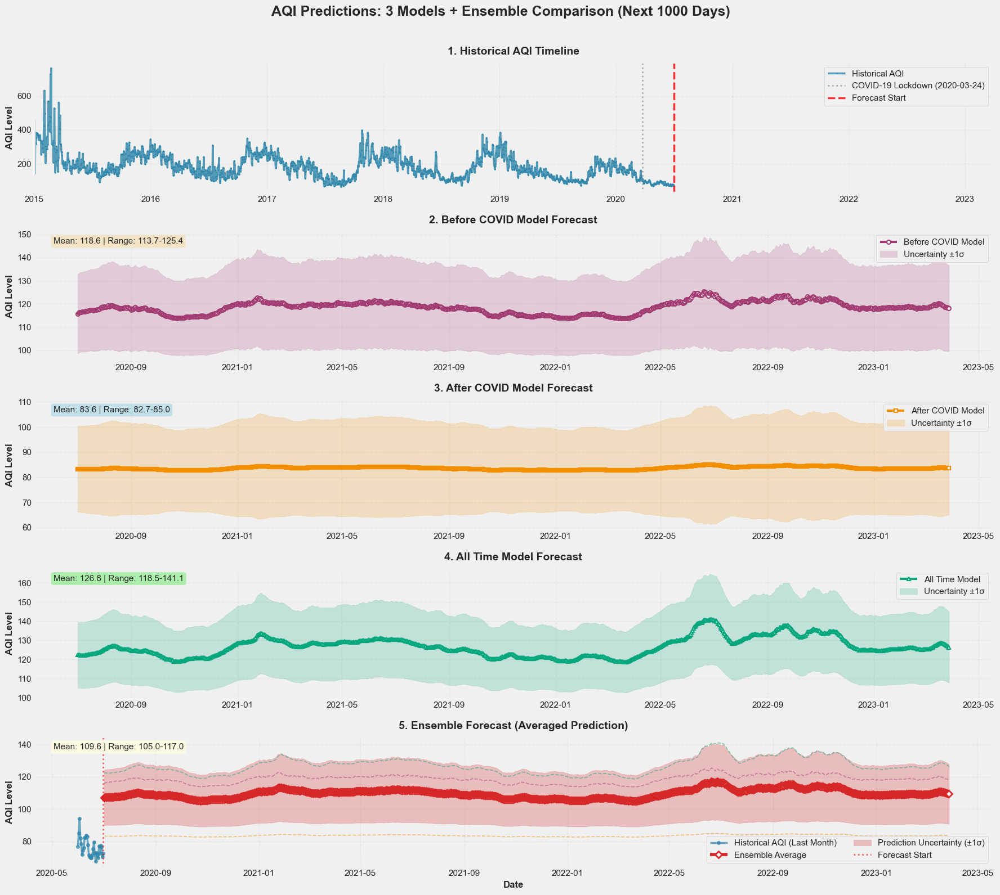


FORECAST SUMMARY STATISTICS

Historical AQI:
  Mean: 183.02 | Std: 75.62
  Min: 63.43 | Max: 764.00

1000-Month Forecast (Before COVID Model):
  Mean: 118.56 | Std: 2.64
  Min: 113.72 | Max: 125.36

1000-Month Forecast (After COVID Model):
  Mean: 83.59 | Std: 0.59
  Min: 82.67 | Max: 84.96

1000-Month Forecast (All Time Model):
  Mean: 126.79 | Std: 5.07
  Min: 118.54 | Max: 141.10

1000-Month Forecast (Ensemble Average):
  Mean: 109.65 | Std: 2.75
  Min: 104.97 | Max: 117.01


In [66]:
## Future AQI Prediction

print("\n Loading trained models...")
try:
    model_before = load_model('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_before_covid.keras')
    model_after = load_model('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_after_covid.keras')
    model_all = load_model('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/lstm_all_time.keras')
    print(" All models loaded successfully!")
except FileNotFoundError as e:
    print(f" Error: Model file not found. Make sure to run scripts 2, 3, and 4 first.")
    exit(1)

# Load aggregated data
aggregated_data = pd.read_csv('D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aggregated_aqi_data.csv')
aggregated_data['Date'] = pd.to_datetime(aggregated_data['Date'])
aggregated_data = aggregated_data.sort_values('Date').reset_index(drop=True)

print(f"\n Data loaded. Last date in training data: {aggregated_data['Date'].iloc[-1]}")

features = ['PM2.5', 'PM10', 'NO2', 'NOx', 'CO', 'SO2']
lookback = 30
covid_date = pd.to_datetime('2020-03-24')
last_date = aggregated_data['Date'].iloc[-1]
prediction_days = 1000  # Days Prediction

print("\n Preparing scalers from historical data...")
X_all = aggregated_data[features].values
y_all = aggregated_data['AQI'].values.reshape(-1, 1)

scaler_X_all = MinMaxScaler()
scaler_y_all = MinMaxScaler()
X_all_scaled = scaler_X_all.fit_transform(X_all)
y_all_scaled = scaler_y_all.fit_transform(y_all)

# Before COVID scalers
before_covid_data = aggregated_data[aggregated_data['Date'] < covid_date]
X_before = before_covid_data[features].values
y_before = before_covid_data['AQI'].values.reshape(-1, 1)
scaler_X_before = MinMaxScaler()
scaler_y_before = MinMaxScaler()
scaler_X_before.fit(X_before)
scaler_y_before.fit(y_before)

# After COVID scalers
after_covid_data = aggregated_data[aggregated_data['Date'] >= covid_date]
X_after = after_covid_data[features].values
y_after = after_covid_data['AQI'].values.reshape(-1, 1)
scaler_X_after = MinMaxScaler()
scaler_y_after = MinMaxScaler()
scaler_X_after.fit(X_after)
scaler_y_after.fit(y_after)

def get_last_sequence():
    """Get the last 30 days of data (lookback window) for making predictions"""
    return X_all_scaled[-lookback:], aggregated_data[features].iloc[-lookback:].values

def generate_future_features(last_features, num_days):
    """
    Generate future features based on statistical patterns
    Uses rolling mean and seasonal patterns
    """
    future_features = []
    
    for i in range(num_days):
        # Calculate rolling mean from last 7 days
        if len(future_features) >= 7:
            recent_mean = np.mean(future_features[-7:], axis=0)
            # Add small random variation (±10%)
            next_features = recent_mean * (1 + np.random.uniform(-0.1, 0.1))
        else:
            # Use last known features with small variation
            next_features = last_features[-1] * (1 + np.random.uniform(-0.05, 0.05))
        
        future_features.append(next_features)
    
    return np.array(future_features)

print(f"\n Generating predictions for next {prediction_days} months...")
last_seq_scaled, last_seq_unscaled = get_last_sequence()
future_features = generate_future_features(last_seq_unscaled, prediction_days)
future_features_scaled = scaler_X_all.transform(future_features)

# Initialize predictions
predictions_before = []
predictions_after = []
predictions_all = []

# Rolling prediction: use each prediction as input for next prediction
current_seq_before = last_seq_scaled.copy()
current_seq_after = last_seq_scaled.copy()
current_seq_all = last_seq_scaled.copy()

print(f" Making predictions for {prediction_days} days...")
for i in range(prediction_days):
    # Predict with all three models
    pred_before = model_before.predict(current_seq_before.reshape(1, lookback, len(features)), verbose=0)[0][0]
    pred_after = model_after.predict(current_seq_after.reshape(1, lookback, len(features)), verbose=0)[0][0]
    pred_all = model_all.predict(current_seq_all.reshape(1, lookback, len(features)), verbose=0)[0][0]
    
    predictions_before.append(pred_before)
    predictions_after.append(pred_after)
    predictions_all.append(pred_all)
    
    # Each model's input must be (lookback_window, num_features) shape
    current_seq_before = np.vstack([current_seq_before[1:], 
                                     future_features_scaled[i].reshape(1, -1)])
    current_seq_after = np.vstack([current_seq_after[1:], 
                                    future_features_scaled[i].reshape(1, -1)])
    current_seq_all = np.vstack([current_seq_all[1:], 
                                  future_features_scaled[i].reshape(1, -1)])

predictions_before_actual = scaler_y_before.inverse_transform(np.array(predictions_before).reshape(-1, 1)).flatten()
predictions_after_actual = scaler_y_after.inverse_transform(np.array(predictions_after).reshape(-1, 1)).flatten()
predictions_all_actual = scaler_y_all.inverse_transform(np.array(predictions_all).reshape(-1, 1)).flatten()

future_dates = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=prediction_days)

# Create results dataframe
results_df = pd.DataFrame({
    'Date': future_dates,
    'Prediction_Before_COVID': predictions_before_actual,
    'Prediction_After_COVID': predictions_after_actual,
    'Prediction_All_Time': predictions_all_actual,
    'Average_Prediction': (predictions_before_actual + predictions_after_actual + predictions_all_actual) / 3
})

print(f"\n First 10 days of predictions:")
print(results_df.head(10))

# Save predictions
results_df.to_csv(f'D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aqi_predictions_{prediction_days}days.csv', index=False)
print(f"\n Predictions saved to CSV")

print("\n Creating enhanced visualization...")

fig, axes = plt.subplots(5, 1, figsize=(18, 16))
fig.suptitle(f'AQI Predictions: 3 Models + Ensemble Comparison (Next {prediction_days} Days)', 
             fontsize=18, fontweight='bold', y=0.995)

# Common styling
colors = {'before': '#A23B72', 'after': '#F18F01', 'all': '#06A77D', 'ensemble': '#D62828', 'historical': '#2E86AB'}
pred_std = np.std([predictions_before_actual, predictions_after_actual, predictions_all_actual], axis=0)

# Plot 1: Full historical timeline with forecast markers
ax = axes[0]
ax.plot(aggregated_data['Date'], aggregated_data['AQI'], linewidth=2.5, label='Historical AQI', 
        color=colors['historical'], marker='o', markersize=1, alpha=0.8)
ax.axvline(covid_date, color='gray', linestyle=':', linewidth=2, alpha=0.6, label='COVID-19 Lockdown (2020-03-24)')
ax.axvline(last_date, color='red', linestyle='--', linewidth=2.5, alpha=0.8, label='Forecast Start')
ax.set_title('1. Historical AQI Timeline', fontsize=14, fontweight='bold', pad=10)
ax.set_ylabel('AQI Level', fontsize=12, fontweight='bold')
ax.legend(loc='best', fontsize=11, framealpha=0.95)
ax.grid(True, alpha=0.3, linestyle='--')
ax.set_xlim(aggregated_data['Date'].min(), future_dates.max())

# Plot 2: Before COVID Model
ax = axes[1]
ax.plot(future_dates, predictions_before_actual, linewidth=3, marker='o', markersize=5, 
        label='Before COVID Model', color=colors['before'], markerfacecolor='white', markeredgewidth=1.5)
ax.fill_between(future_dates, predictions_before_actual - pred_std, predictions_before_actual + pred_std,
                alpha=0.2, color=colors['before'], label='Uncertainty ±1σ')
ax.set_title('2. Before COVID Model Forecast', fontsize=14, fontweight='bold', pad=10)
ax.set_ylabel('AQI Level', fontsize=12, fontweight='bold')
ax.legend(loc='best', fontsize=11, framealpha=0.95)
ax.grid(True, alpha=0.3, linestyle='--')
ax.text(0.02, 0.95, f"Mean: {predictions_before_actual.mean():.1f} | Range: {predictions_before_actual.min():.1f}-{predictions_before_actual.max():.1f}",
        transform=ax.transAxes, fontsize=11, verticalalignment='top', 
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))

# Plot 3: After COVID Model
ax = axes[2]
ax.plot(future_dates, predictions_after_actual, linewidth=3, marker='s', markersize=5,
        label='After COVID Model', color=colors['after'], markerfacecolor='white', markeredgewidth=1.5)
ax.fill_between(future_dates, predictions_after_actual - pred_std, predictions_after_actual + pred_std,
                alpha=0.2, color=colors['after'], label='Uncertainty ±1σ')
ax.set_title('3. After COVID Model Forecast', fontsize=14, fontweight='bold', pad=10)
ax.set_ylabel('AQI Level', fontsize=12, fontweight='bold')
ax.legend(loc='best', fontsize=11, framealpha=0.95)
ax.grid(True, alpha=0.3, linestyle='--')
ax.text(0.02, 0.95, f"Mean: {predictions_after_actual.mean():.1f} | Range: {predictions_after_actual.min():.1f}-{predictions_after_actual.max():.1f}",
        transform=ax.transAxes, fontsize=11, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.7))

# Plot 4: All Time Model
ax = axes[3]
ax.plot(future_dates, predictions_all_actual, linewidth=3, marker='^', markersize=5,
        label='All Time Model', color=colors['all'], markerfacecolor='white', markeredgewidth=1.5)
ax.fill_between(future_dates, predictions_all_actual - pred_std, predictions_all_actual + pred_std,
                alpha=0.2, color=colors['all'], label='Uncertainty ±1σ')
ax.set_title('4. All Time Model Forecast', fontsize=14, fontweight='bold', pad=10)
ax.set_ylabel('AQI Level', fontsize=12, fontweight='bold')
ax.legend(loc='best', fontsize=11, framealpha=0.95)
ax.grid(True, alpha=0.3, linestyle='--')
ax.text(0.02, 0.95, f"Mean: {predictions_all_actual.mean():.1f} | Range: {predictions_all_actual.min():.1f}-{predictions_all_actual.max():.1f}",
        transform=ax.transAxes, fontsize=11, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.7))

# Plot 5: Ensemble Average with all models overlaid
ax = axes[4]
# Plot historical context (last 30 days)
last_month = aggregated_data[aggregated_data['Date'] >= (last_date - pd.Timedelta(days=30))]
ax.plot(last_month['Date'], last_month['AQI'], linewidth=2.5, marker='o', markersize=4,
        label='Historical AQI (Last Month)', color=colors['historical'], alpha=0.7)
# Plot ensemble
ax.plot(future_dates, results_df['Average_Prediction'], linewidth=4, marker='D', markersize=6,
        label='Ensemble Average', color=colors['ensemble'], markerfacecolor='white', markeredgewidth=2)
# Plot uncertainty band
ax.fill_between(future_dates, results_df['Average_Prediction'] - pred_std, 
                results_df['Average_Prediction'] + pred_std,
                alpha=0.25, color=colors['ensemble'], label='Prediction Uncertainty (±1σ)')
# Plot individual models as thin lines
ax.plot(future_dates, predictions_before_actual, linewidth=1.2, alpha=0.5, color=colors['before'], linestyle='--')
ax.plot(future_dates, predictions_after_actual, linewidth=1.2, alpha=0.5, color=colors['after'], linestyle='--')
ax.plot(future_dates, predictions_all_actual, linewidth=1.2, alpha=0.5, color=colors['all'], linestyle='--')
ax.axvline(last_date, color='red', linestyle=':', linewidth=2, alpha=0.6, label='Forecast Start')
ax.set_title('5. Ensemble Forecast (Averaged Prediction)', fontsize=14, fontweight='bold', pad=10)
ax.set_xlabel('Date', fontsize=12, fontweight='bold')
ax.set_ylabel('AQI Level', fontsize=12, fontweight='bold')
ax.legend(loc='best', fontsize=11, framealpha=0.95, ncol=2)
ax.grid(True, alpha=0.3, linestyle='--')
ax.text(0.02, 0.95, f"Mean: {results_df['Average_Prediction'].mean():.1f} | Range: {results_df['Average_Prediction'].min():.1f}-{results_df['Average_Prediction'].max():.1f}",
        transform=ax.transAxes, fontsize=11, verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))


plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.savefig(f'D:/BACKUP Fathin/ITB/Semester 7/Topik Khusus Sains Data/aqi_forecast_{prediction_days}days.png', 
            dpi=300, bbox_inches='tight')
print(f"Enhanced visualization saved to aqi_forecast_{prediction_days}days.png")
plt.show()  # Display directly in Jupyter notebook

# Summary statistics
print("\n" + "="*80)
print("FORECAST SUMMARY STATISTICS")
print("="*80)
print(f"\nHistorical AQI:")
print(f"  Mean: {aggregated_data['AQI'].mean():.2f} | Std: {aggregated_data['AQI'].std():.2f}")
print(f"  Min: {aggregated_data['AQI'].min():.2f} | Max: {aggregated_data['AQI'].max():.2f}")

print(f"\n{prediction_days}-Month Forecast (Before COVID Model):")
print(f"  Mean: {predictions_before_actual.mean():.2f} | Std: {predictions_before_actual.std():.2f}")
print(f"  Min: {predictions_before_actual.min():.2f} | Max: {predictions_before_actual.max():.2f}")

print(f"\n{prediction_days}-Month Forecast (After COVID Model):")
print(f"  Mean: {predictions_after_actual.mean():.2f} | Std: {predictions_after_actual.std():.2f}")
print(f"  Min: {predictions_after_actual.min():.2f} | Max: {predictions_after_actual.max():.2f}")

print(f"\n{prediction_days}-Month Forecast (All Time Model):")
print(f"  Mean: {predictions_all_actual.mean():.2f} | Std: {predictions_all_actual.std():.2f}")
print(f"  Min: {predictions_all_actual.min():.2f} | Max: {predictions_all_actual.max():.2f}")

print(f"\n{prediction_days}-Month Forecast (Ensemble Average):")
print(f"  Mean: {results_df['Average_Prediction'].mean():.2f} | Std: {results_df['Average_Prediction'].std():.2f}")
print(f"  Min: {results_df['Average_Prediction'].min():.2f} | Max: {results_df['Average_Prediction'].max():.2f}")
